# EDA
reference: https://www.kaggle.com/thykhuely/mercari-interactive-eda-topic-modelling

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline

In [116]:
train11 = pd.read_csv('train.tsv', sep='\t')
# test = pd.read_csv('test.tsv', sep='\t')

In [117]:
train11.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity


In [16]:
print(train.shape)
print(test.shape)

(1482535, 8)
(693359, 7)


In [17]:
train.dtypes

train_id               int64
name                  object
item_condition_id      int64
category_name         object
brand_name            object
price                float64
shipping               int64
item_description      object
dtype: object

In [18]:
test.dtypes

test_id               int64
name                 object
item_condition_id     int64
category_name        object
brand_name           object
shipping              int64
item_description     object
dtype: object

In [47]:
train.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o,new_tag,warrant,cat_new_level,new_category,des_len_level,tokens
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3,"['description', 'yet']",description yet,0,0,0,Men,0,"[description, yet]"
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36,"['keyboard', 'great', 'condition', 'works',...",keyboard great condition works like came box p...,0,0,0,Electronics,1,"[keyboard, great, condition, works, like, came..."
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29,"['adorable', 'top', 'hint', 'lace', 'key',...",adorable top hint lace key hole back pale pink...,0,0,0,Women,1,"[adorable, top, hint, lace, key, hole, back, p..."
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32,"['new', 'tags', 'leather', 'horses', 'reta...",new tags leather horses retail rm stand foot h...,1,0,0,Home,1,"[new, tags, leather, horses, retail, stand, fo..."
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5,"['complete', 'certificate', 'authenticity']",complete certificate authenticity,0,0,0,Women,0,"[complete, certificate, authenticity]"


In [48]:
train["log_price"] = train.apply(lambda x : np.log(x['price']+1),axis=1)

## Y: Price
### 價格分布相當不均

In [7]:
train.price.describe()

count    1.482535e+06
mean     2.673752e+01
std      3.858607e+01
min      0.000000e+00
25%      1.000000e+01
50%      1.700000e+01
75%      2.900000e+01
max      2.009000e+03
Name: price, dtype: float64

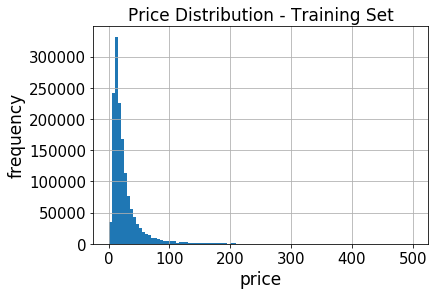

In [8]:
import matplotlib.pyplot as plt

train['price'].hist(bins = 100, range = [0, 500])
plt.xlabel('price', fontsize=17)
plt.ylabel('frequency', fontsize=17)
plt.tick_params(labelsize=15)
plt.title('Price Distribution - Training Set', fontsize=17)
plt.show()

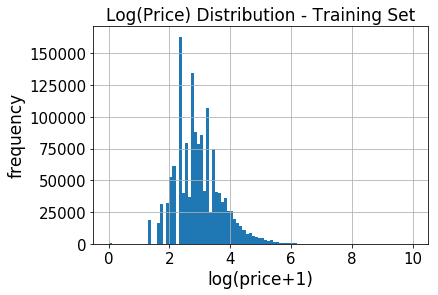

In [9]:
import numpy as np

np.log(train['price']+1).hist(bins = 100, range = [0, 10])
plt.xlabel('log(price+1)', fontsize=17)
plt.ylabel('frequency', fontsize=17)
plt.tick_params(labelsize=15)
plt.title('Log(Price) Distribution - Training Set', fontsize=17)
plt.show()

## item_condition_id
### 商品狀況以1~3較多，較差的商品較少人賣(或怕賣不好不願意標計)

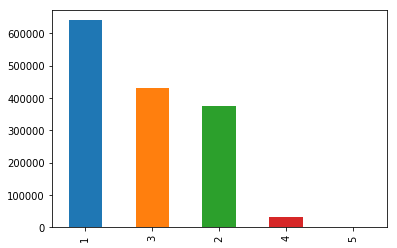

In [10]:
train['item_condition_id'].value_counts().plot.bar()
plt.show()

In [11]:
train['item_condition_id'].value_counts()/len(train)

1    0.432063
3    0.291501
2    0.253268
4    0.021559
5    0.001608
Name: item_condition_id, dtype: float64

## price x item_condition_id

In [12]:
price_condition1 = train.loc[train['item_condition_id']==1, 'price']
price_condition2 = train.loc[train['item_condition_id']==2, 'price']
price_condition3 = train.loc[train['item_condition_id']==3, 'price']
price_condition4 = train.loc[train['item_condition_id']==4, 'price']
price_condition5 = train.loc[train['item_condition_id']==5, 'price']

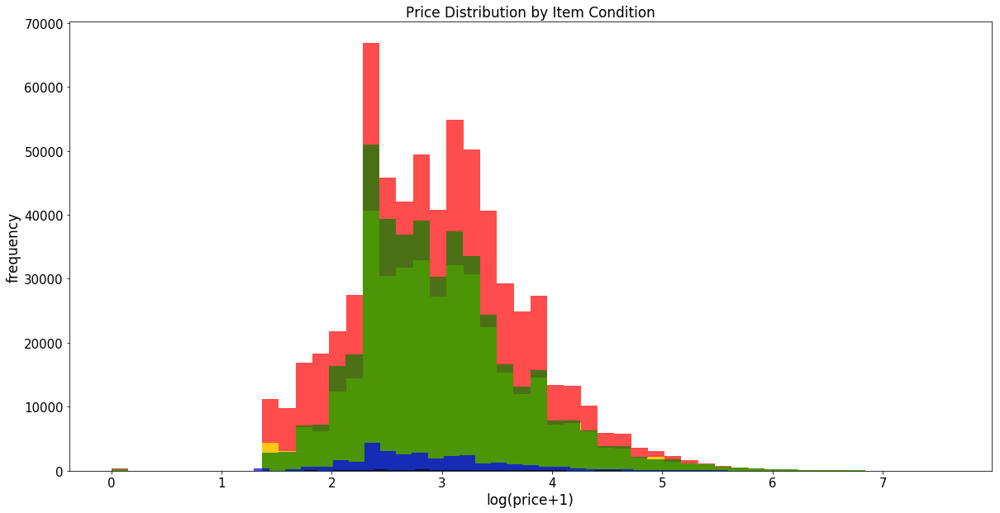

In [13]:
fig, ax = plt.subplots(figsize=(20,10))
ax.hist(np.log(price_condition1+1), color='red', alpha=0.7, bins=50,
       label='Price when Condition = 1')
ax.hist(np.log(price_condition2+1), color='yellow', alpha=0.7, bins=50,
       label='Price when Condition = 2')
ax.hist(np.log(price_condition3+1), color='green', alpha=0.7, bins=50,
       label='Price when Condition = 3')
ax.hist(np.log(price_condition4+1), color='blue', alpha=0.7, bins=50,
       label='Price when Condition = 4')
ax.hist(np.log(price_condition5+1), color='black', alpha=0.7, bins=50,
       label='Price when Condition = 5')

plt.xlabel('log(price+1)', fontsize=17)
plt.ylabel('frequency', fontsize=17)
plt.title('Price Distribution by Item Condition', fontsize=17)
plt.tick_params(labelsize=15)
plt.show()

## shipping

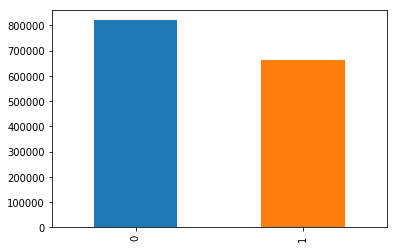

In [14]:
train['shipping'].value_counts().plot.bar()
plt.show()

In [15]:
train['shipping'].value_counts()/len(train)

0    0.552726
1    0.447274
Name: shipping, dtype: float64

## price x shipping
### ship 1 =賣家付 ，整體來說不會有因為賣的東西比較貴，運費由買家自己吸收的趨勢

In [411]:
price_shipping0 = train.loc[train['shipping']==0, 'price']
price_shipping1 = train.loc[train['shipping']==1, 'price']

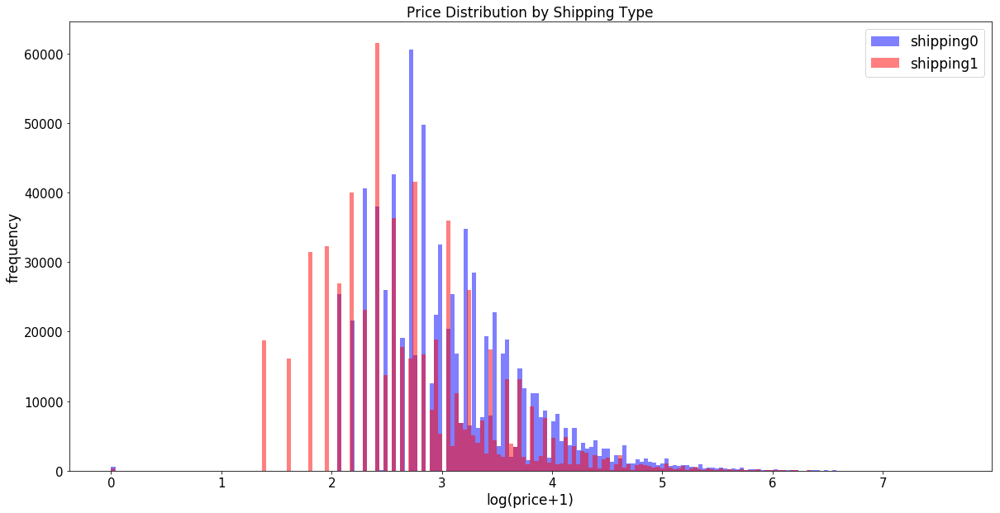

In [417]:
fig, ax = plt.subplots(figsize=(20, 10))
ax.hist(np.log(price_shipping0+1), color='blue', alpha=0.5, bins=200,
       label='Price when Shipping = 0')
ax.hist(np.log(price_shipping1+1), color='red', alpha=0.5, bins=200,
       label='Price when Shipping = 1')
plt.xlabel('log(price+1)', fontsize=17)
plt.ylabel('frequency', fontsize=17)
plt.legend(('shipping0', 'shipping1'), fontsize=17)
plt.title('Price Distribution by Shipping Type', fontsize=17)
plt.tick_params(labelsize=15)
plt.show()

## category_name

In [18]:
train['category_name'].nunique()

1287

In [19]:
train['category_name'].value_counts()[:10]

Women/Athletic Apparel/Pants, Tights, Leggings                 60177
Women/Tops & Blouses/T-Shirts                                  46380
Beauty/Makeup/Face                                             34335
Beauty/Makeup/Lips                                             29910
Electronics/Video Games & Consoles/Games                       26557
Beauty/Makeup/Eyes                                             25215
Electronics/Cell Phones & Accessories/Cases, Covers & Skins    24676
Women/Underwear/Bras                                           21274
Women/Tops & Blouses/Blouse                                    20284
Women/Tops & Blouses/Tank, Cami                                20284
Name: category_name, dtype: int64

In [20]:
train['category_name'].isnull().sum() / len(train)

0.0042676901388500107

In [21]:
train[['cat1', 'cat2', 'cat3', 'cat4', 'cat5']] = train['category_name'].apply(lambda x: pd.Series(str(x).split('/')))

In [22]:
train.head(20)

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,cat4,cat5
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,NaN,NaN
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,NaN,NaN
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,NaN,NaN
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,NaN,NaN
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,NaN,NaN
5,5,Bundled items requested for Ruie,3,Women/Other/Other,NaN,59.0,0,"Banana republic bottoms, Candies skirt with ma...",Women,Other,Other,NaN,NaN
6,6,Acacia pacific tides santorini top,3,Women/Swimwear/Two-Piece,Acacia Swimwear,64.0,0,Size small but straps slightly shortened to fi...,Women,Swimwear,Two-Piece,NaN,NaN
7,7,Girls cheer and tumbling bundle of 7,3,Sports & Outdoors/Apparel/Girls,Soffe,6.0,1,You get three pairs of Sophie cheer shorts siz...,Sports & Outdoors,Apparel,Girls,NaN,NaN
8,8,Girls Nike Pro shorts,3,Sports & Outdoors/Apparel/Girls,Nike,19.0,0,Girls Size small Plus green. Three shorts total.,Sports & Outdoors,Apparel,Girls,NaN,NaN
9,9,Porcelain clown doll checker pants VTG,3,Vintage & Collectibles/Collectibles/Doll,NaN,8.0,0,I realized his pants are on backwards after th...,Vintage & Collectibles,Collectibles,Doll,NaN,NaN


In [23]:
train = train.drop(['cat4', 'cat5'], axis=1)

In [24]:
train.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces


In [426]:
train['cat1'].nunique(), train['cat2'].nunique(), train['cat3'].nunique()

(10, 113, 870)

In [438]:
train['cat1'].value_counts()

Women                     664385
Beauty                    207828
Kids                      171689
Electronics               122690
Men                        93680
Home                       67871
Vintage & Collectibles     46530
Other                      45351
Handmade                   30842
Sports & Outdoors          25342
Name: cat1, dtype: int64

### 產品種類以女性服飾居多

In [427]:
train['cat1'].value_counts()

Women                     664385
Beauty                    207828
Kids                      171689
Electronics               122690
Men                        93680
Home                       67871
Vintage & Collectibles     46530
Other                      45351
Handmade                   30842
Sports & Outdoors          25342
Name: cat1, dtype: int64

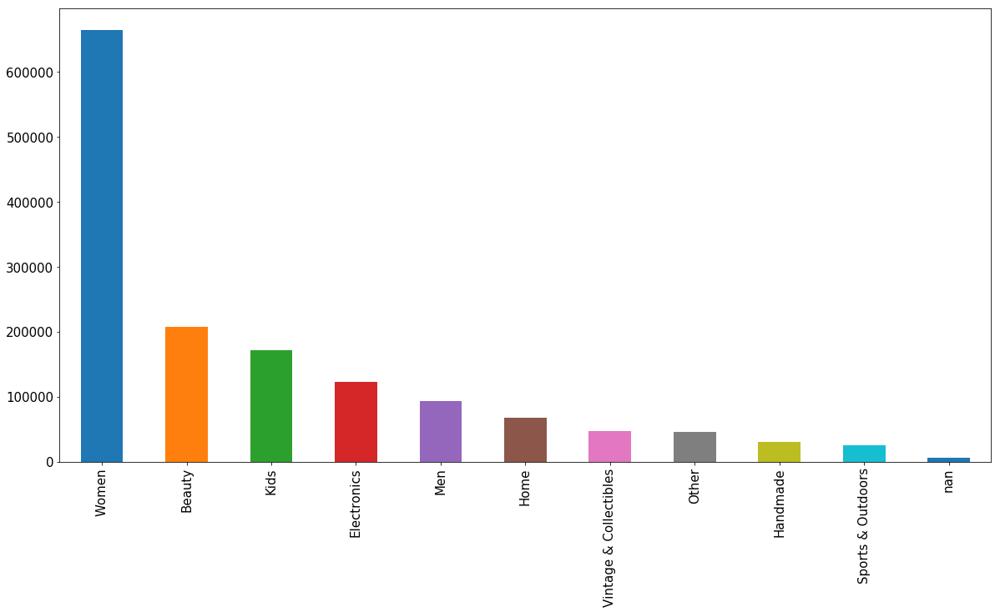

In [28]:
fig, ax = plt.subplots(figsize=(20,10))
train['cat1'].value_counts().plot.bar()
plt.tick_params(labelsize=15)
plt.show()

In [29]:
train['cat2'].value_counts()[:20]

Athletic Apparel             134383
Makeup                       124624
Tops & Blouses               106960
Shoes                        100452
Jewelry                       61763
Toys                          58158
Cell Phones & Accessories     53290
Women's Handbags              45862
Dresses                       45758
Women's Accessories           42350
Jeans                         36130
Video Games & Consoles        35971
Sweaters                      35752
Underwear                     33784
Skin Care                     29838
Home Décor                    25188
Fragrance                     24294
Kitchen & Dining              21954
Tops                          20591
Other                         20017
Name: cat2, dtype: int64

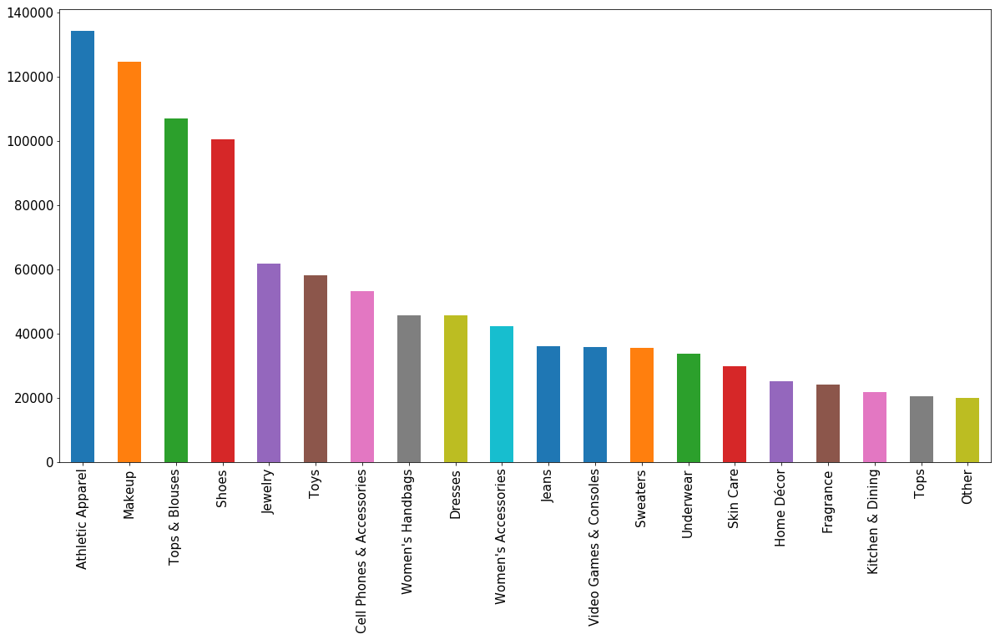

In [30]:
fig, ax = plt.subplots(figsize=(20,10))
train['cat2'].value_counts()[:20].plot.bar()
plt.tick_params(labelsize=15)
plt.show()

In [31]:
train['cat3'].value_counts()[:20]

Pants, Tights, Leggings    60177
Other                      50224
Face                       50171
T-Shirts                   46380
Shoes                      32168
Games                      30906
Lips                       30871
Athletic                   27059
Eyes                       26038
Cases, Covers & Skins      24676
Shorts                     21815
Bras                       21274
Blouse                     20288
Tank, Cami                 20284
Boots                      20270
Above Knee, Mini           20082
Necklaces                  19758
Makeup Palettes            19103
Women                      18975
Shirts & Tops              16876
Name: cat3, dtype: int64

### 各主類別下的子類別相同程度相當低

In [201]:
crosstable = pd.crosstab(train['cat2'], train["cat1"])
crosstable['sum'] = crosstable.sum(axis=1)
crosstable.sort_values('sum', ascending=False)

cat1,Beauty,Electronics,Handmade,Home,Kids,Men,Other,Sports & Outdoors,Vintage & Collectibles,Women,sum
cat2,,,,,,,,,,,
Athletic Apparel,0,0,0,0,0,10926,0,0,0,123457,134383
Makeup,124624,0,0,0,0,0,0,0,0,0,124624
Tops & Blouses,0,0,0,0,0,0,0,0,0,106960,106960
Shoes,0,0,0,0,0,22798,0,0,0,77654,100452
Jewelry,0,0,2399,0,0,0,0,0,2527,56837,61763
Toys,0,0,449,0,57709,0,0,0,0,0,58158
Cell Phones & Accessories,0,53290,0,0,0,0,0,0,0,0,53290
Women's Handbags,0,0,0,0,0,0,0,0,0,45862,45862
Dresses,0,0,0,0,0,0,0,0,0,45758,45758


## price x category_name
### 各種類內的商品價格差異都相當大，因此平均後會發現各類的總平均差異並不多

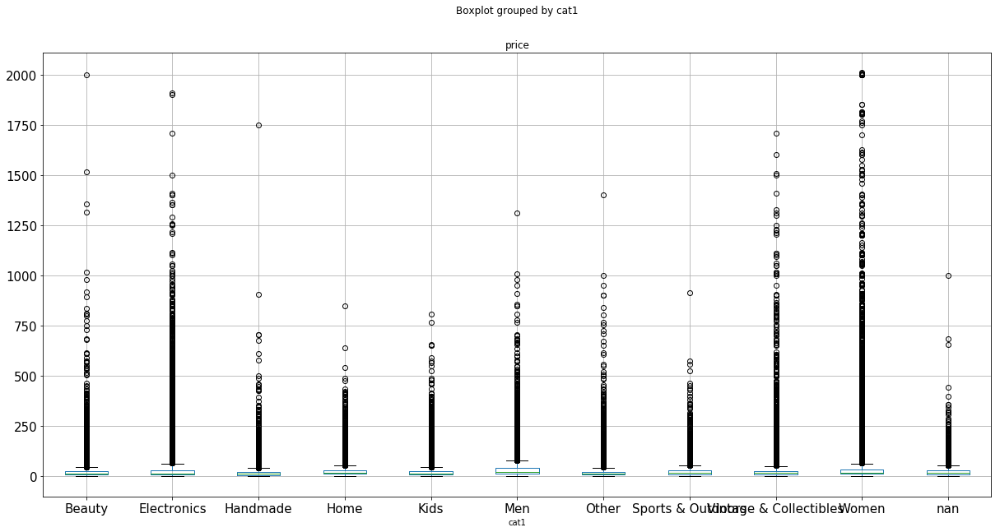

In [32]:
train.boxplot(column='price', by='cat1', figsize=(20,10))
plt.tick_params(labelsize=15)
plt.show()

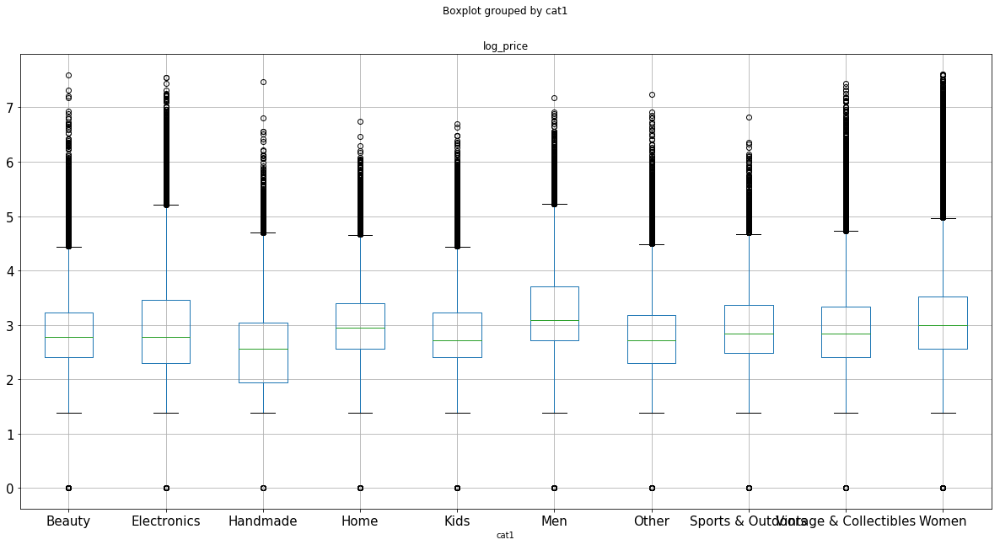

In [49]:
train.boxplot(column='log_price', by='cat1', figsize=(20,10))
plt.tick_params(labelsize=15)
plt.show()

In [33]:
train.groupby('cat1')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
cat1,,,,,,,,
Beauty,207828.0,19.671536,21.360135,0.0,10.0,15.0,24.0,2000.0
Electronics,122690.0,35.173922,65.419784,0.0,9.0,15.0,31.0,1909.0
Handmade,30842.0,18.156572,27.758289,0.0,6.0,12.0,20.0,1750.0
Home,67871.0,24.536599,24.417061,0.0,12.0,18.0,29.0,848.0
Kids,171689.0,20.642315,22.730876,0.0,10.0,14.0,24.0,809.0
Men,93680.0,34.708614,41.240057,0.0,14.0,21.0,40.0,1309.0
Other,45351.0,20.809817,29.847758,0.0,9.0,14.0,23.0,1400.0
Sports & Outdoors,25342.0,25.532219,29.302234,0.0,11.0,16.0,28.0,915.0
Vintage & Collectibles,46530.0,27.339426,53.507495,0.0,10.0,16.0,27.0,1709.0


## brand_name
### 總共有4809個品牌，但是各品牌商品量嚴重不均

In [34]:
train['brand_name'].nunique()

4809

In [144]:
train['brand_name'].value_counts()[190:200]

bareMinerals        611
ALDO                609
Gildan              598
Brighton            594
New Era             564
Bare Escentuals     563
Silver Jeans Co.    557
MLB                 555
ASICS               554
Yankee Candle       549
Name: brand_name, dtype: int64

In [36]:
train['brand_name'].isnull().sum() / len(train)

0.42675687251902988

### 雖然超過一半有標記品牌名稱，但從下頭可以看到很多品牌，而到後段很多品牌只有一件商品，通常價值較低，但也有少數很貴的產品，在下下張圖可以看到

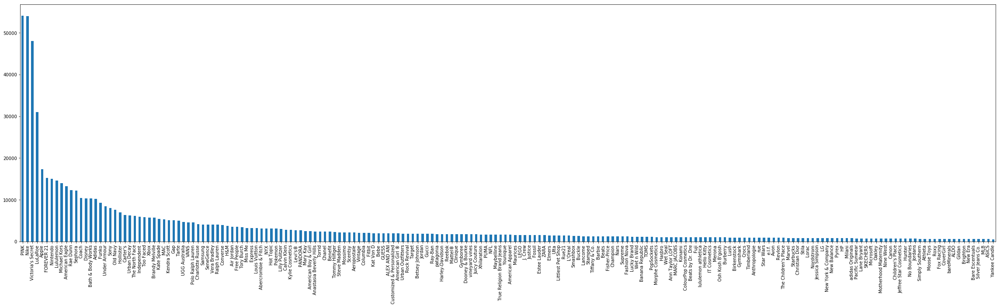

In [138]:
train['brand_name'].value_counts()[:200].plot.bar(figsize=(40, 10))
plt.show()

## brand_name x cat

In [87]:
crosstable = pd.crosstab(train['brand_name'], train['cat1'])
crosstable['sum'] = crosstable.sum(axis=1)
crosstable.sort_values('sum', ascending=False)

cat1,Beauty,Electronics,Handmade,Home,Kids,Men,Other,Sports & Outdoors,Vintage & Collectibles,Women,nan,sum
brand_name,,,,,,,,,,,,
PINK,22,7,1,28,13,872,16,37,333,52601,158,54088
Nike,0,1,1,0,13355,14086,3,2027,51,24436,83,54043
Victoria's Secret,8635,4,6,10,3,1,3,14,250,39009,101,48036
LuLaRoe,0,0,1,0,88,3,0,17,0,30764,151,31024
Apple,0,17264,0,0,11,1,0,0,5,12,29,17322
FOREVER 21,0,0,0,0,0,276,0,0,168,14661,81,15186
Nintendo,0,13679,0,1,170,72,2,0,1057,2,24,15007
Lululemon,0,0,0,0,0,314,0,1,15,14218,10,14558
Michael Kors,9,9,1,0,26,296,0,0,415,13139,33,13928


## price x brand_name

In [203]:
train.groupby('brand_name')['price'].describe().sort_values('mean', ascending=False)

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
Demdaco,2.0,429.000000,592.555483,10.0,219.50,429.0,638.50,848.0
Proenza Schouler,4.0,413.250000,420.369183,16.0,217.75,315.5,511.00,1006.0
Auto Meter,1.0,344.000000,NaN,344.0,344.00,344.0,344.00,344.0
Oris,1.0,300.000000,NaN,300.0,300.00,300.0,300.00,300.0
MCM Worldwide,69.0,289.173913,351.470773,11.0,54.00,129.0,356.00,1359.0
Longines,1.0,254.000000,NaN,254.0,254.00,254.0,254.00,254.0
Vitamix,9.0,253.111111,182.156831,16.0,190.00,205.0,300.00,640.0
Blendtec,5.0,251.800000,107.778477,134.0,180.00,250.0,280.00,415.0
David Yurman,242.0,248.611570,190.054736,7.0,170.00,220.0,300.00,2004.0


In [202]:
train.groupby('brand_name')['price'].describe().sort_values('mean', ascending=False).query('count < 100')

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
Demdaco,2.0,429.000000,592.555483,10.0,219.50,429.0,638.50,848.0
Proenza Schouler,4.0,413.250000,420.369183,16.0,217.75,315.5,511.00,1006.0
Auto Meter,1.0,344.000000,NaN,344.0,344.00,344.0,344.00,344.0
Oris,1.0,300.000000,NaN,300.0,300.00,300.0,300.00,300.0
MCM Worldwide,69.0,289.173913,351.470773,11.0,54.00,129.0,356.00,1359.0
Longines,1.0,254.000000,NaN,254.0,254.00,254.0,254.00,254.0
Vitamix,9.0,253.111111,182.156831,16.0,190.00,205.0,300.00,640.0
Blendtec,5.0,251.800000,107.778477,134.0,180.00,250.0,280.00,415.0
Celine,73.0,238.780822,339.356795,12.0,65.00,149.0,239.00,1806.0


In [50]:
train.groupby('brand_name')['log_price'].describe().sort_values('mean', ascending=False)

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
Auto Meter,1.0,5.843544,NaN,5.843544,5.843544,5.843544,5.843544,5.843544
Oris,1.0,5.707110,NaN,5.707110,5.707110,5.707110,5.707110,5.707110
Longines,1.0,5.541264,NaN,5.541264,5.541264,5.541264,5.541264,5.541264
Blendtec,5.0,5.459653,0.429500,4.905275,5.198497,5.525453,5.638355,6.030685
Dainese,1.0,5.442418,NaN,5.442418,5.442418,5.442418,5.442418,5.442418
Frédérique Constant,1.0,5.416100,NaN,5.416100,5.416100,5.416100,5.416100,5.416100
Contours,3.0,5.318899,0.050424,5.278115,5.290710,5.303305,5.339292,5.375278
Proenza Schouler,4.0,5.313315,1.743576,2.833213,4.950297,5.752658,6.115676,6.914731
Alyce Paris,1.0,5.303305,NaN,5.303305,5.303305,5.303305,5.303305,5.303305


In [51]:
train.groupby('brand_name')['log_price'].describe().sort_values('mean', ascending=False).query('count < 100')

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
Auto Meter,1.0,5.843544,NaN,5.843544,5.843544,5.843544,5.843544,5.843544
Oris,1.0,5.707110,NaN,5.707110,5.707110,5.707110,5.707110,5.707110
Longines,1.0,5.541264,NaN,5.541264,5.541264,5.541264,5.541264,5.541264
Blendtec,5.0,5.459653,0.429500,4.905275,5.198497,5.525453,5.638355,6.030685
Dainese,1.0,5.442418,NaN,5.442418,5.442418,5.442418,5.442418,5.442418
Frédérique Constant,1.0,5.416100,NaN,5.416100,5.416100,5.416100,5.416100,5.416100
Contours,3.0,5.318899,0.050424,5.278115,5.290710,5.303305,5.339292,5.375278
Proenza Schouler,4.0,5.313315,1.743576,2.833213,4.950297,5.752658,6.115676,6.914731
Alyce Paris,1.0,5.303305,NaN,5.303305,5.303305,5.303305,5.303305,5.303305


### 數量最少的後100名品牌中，有2%是較高價位商品

In [205]:
a = len(train.groupby('brand_name')['price'].describe().sort_values('mean', ascending=False).query('count < 100 & mean > 100')["mean"])
b = len(train.groupby('brand_name')['price'].describe().sort_values('mean', ascending=False).query('count < 100')["mean"])
a/b

0.025465692053760907

In [211]:
a = len(train.groupby('brand_name')['price'].describe().sort_values('mean', ascending=False).query('count < 1000 & mean > 100')["mean"])
b = len(train.groupby('brand_name')['price'].describe().sort_values('mean', ascending=False).query('count < 1000')["mean"])
a/b

0.025712449110777802

In [207]:
a = len(train.groupby('brand_name')['price'].describe().sort_values('mean', ascending=False).query('count < 10000 & mean > 100')["mean"])
b = len(train.groupby('brand_name')['price'].describe().sort_values('mean', ascending=False).query('count < 10000')["mean"])
a/b

0.025245149175881495

In [209]:
a = len(train.groupby('brand_name')['price'].describe().sort_values('mean', ascending=False).query('count < 20000 & mean > 100 & count > 10000')["mean"])
b = len(train.groupby('brand_name')['price'].describe().sort_values('mean', ascending=False).query('count < 20000 & count > 10000')["mean"])
a/b

0.0

In [85]:
brand_price = train.groupby('brand_name')['price'].describe().sort_values('mean', ascending=False).query('count >= 50')
brand_price

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
MCM Worldwide,69.0,289.173913,351.470773,11.0,54.00,129.0,356.00,1359.0
David Yurman,242.0,248.611570,190.054736,7.0,170.00,220.0,300.00,2004.0
Celine,73.0,238.780822,339.356795,12.0,65.00,149.0,239.00,1806.0
Saint Laurent,128.0,232.578125,339.769830,3.0,38.25,100.0,270.00,1700.0
MICHELE,59.0,216.983051,224.704134,10.0,39.50,134.0,306.00,906.0
Louis Vuitton,3187.0,202.187637,247.801644,3.0,41.00,106.0,264.00,1815.0
Stuart Weitzman,60.0,198.716667,191.225937,5.0,39.75,128.5,334.00,679.0
Valentino,96.0,191.083333,201.671576,11.0,41.00,106.0,292.50,909.0
Christian Louboutin,360.0,188.444444,142.998850,9.0,70.75,156.0,299.25,650.0


## item_description

In [38]:
train['item_description'] = train['item_description'].astype(str)
train['des_len'] = train['item_description'].apply(lambda x: len(x.split()))
train.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5


### 計算描述長度

In [39]:
train['des_len'].describe()

count    1.482535e+06
mean     2.568858e+01
std      3.039363e+01
min      1.000000e+00
25%      7.000000e+00
50%      1.500000e+01
75%      3.100000e+01
max      2.450000e+02
Name: des_len, dtype: float64

In [40]:
pd.Series(' '.join(train['item_description']).split()).value_counts()

and                    804169
the                    535906
a                      526975
for                    496628
to                     443334
in                     435936
with                   431449
is                     399950
of                     334075
I                      269918
on                     248102
new                    217416
size                   200968
or                     193236
No                     192121
you                    191891
are                    191403
Size                   182099
Brand                  170193
[rm]                   169715
-                      156260
it                     149610
but                    144789
my                     138736
New                    138061
free                   131881
have                   128306
&                      123305
from                   119671
will                   117777
                        ...  
Youse                       1
chunk).                     1
Mink-brown

### 刪除停字詞，轉關鍵字

In [41]:
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
import re

def document_to_wordlist_for_eng(text, remove_stopwords = False):
    # Function to convert a document to a sequence of words,
    # optionally removing stop words.  Returns a list of words.
    #
    # 1. Remove html
    no_html_text = text.str.replace('http\S+|www.\S+', '', case=False)
    #
    # 2. Remove non-letters
    cleaned_text = no_html_text.apply(lambda y: re.sub('[^a-zA-Z0-9]',' ', y))
    #tokenizer = RegexpTokenizer(r'\w+')
    #cleaned_text = tokenizer.tokenize(no_html_text)
    #
    # 3. Convert words to lower case and split them
    splitted_cleaned_text = cleaned_text.str.lower().str.split()
    #
    # 4. Optionally remove stop words (false by default)
    if remove_stopwords:
        stops = set(stopwords.words("english"))
        splitted_cleaned_text = splitted_cleaned_text.apply(lambda z: [w for w in z if w not in stops])
    #
    # 5. Return a list of words
    return(splitted_cleaned_text)

In [42]:
train['des_cleaned'] = document_to_wordlist_for_eng(train['item_description'], remove_stopwords = True)
train.head(10)

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3,"[description, yet]"
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36,"[keyboard, great, condition, works, like, came..."
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29,"[adorable, top, hint, lace, key, hole, back, p..."
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32,"[new, tags, leather, horses, retail, rm, stand..."
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5,"[complete, certificate, authenticity]"
5,5,Bundled items requested for Ruie,3,Women/Other/Other,NaN,59.0,0,"Banana republic bottoms, Candies skirt with ma...",Women,Other,Other,15,"[banana, republic, bottoms, candies, skirt, ma..."
6,6,Acacia pacific tides santorini top,3,Women/Swimwear/Two-Piece,Acacia Swimwear,64.0,0,Size small but straps slightly shortened to fi...,Women,Swimwear,Two-Piece,13,"[size, small, straps, slightly, shortened, fit..."
7,7,Girls cheer and tumbling bundle of 7,3,Sports & Outdoors/Apparel/Girls,Soffe,6.0,1,You get three pairs of Sophie cheer shorts siz...,Sports & Outdoors,Apparel,Girls,51,"[get, three, pairs, sophie, cheer, shorts, siz..."
8,8,Girls Nike Pro shorts,3,Sports & Outdoors/Apparel/Girls,Nike,19.0,0,Girls Size small Plus green. Three shorts total.,Sports & Outdoors,Apparel,Girls,8,"[girls, size, small, plus, green, three, short..."
9,9,Porcelain clown doll checker pants VTG,3,Vintage & Collectibles/Collectibles/Doll,NaN,8.0,0,I realized his pants are on backwards after th...,Vintage & Collectibles,Collectibles,Doll,55,"[realized, pants, backwards, picture, dirty, h..."


In [43]:
train['des_cleaned_o'] = pd.Series(train['des_cleaned']).str
train.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3,"[description, yet]",<pandas.core.strings.StringMethods object at 0...
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36,"[keyboard, great, condition, works, like, came...",<pandas.core.strings.StringMethods object at 0...
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29,"[adorable, top, hint, lace, key, hole, back, p...",<pandas.core.strings.StringMethods object at 0...
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32,"[new, tags, leather, horses, retail, rm, stand...",<pandas.core.strings.StringMethods object at 0...
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5,"[complete, certificate, authenticity]",<pandas.core.strings.StringMethods object at 0...


In [44]:
train['des_cleaned_o'] = train['des_cleaned'].apply(lambda y: " ".join(map(str, y)))
train.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3,"[description, yet]",description yet
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36,"[keyboard, great, condition, works, like, came...",keyboard great condition works like came box p...
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29,"[adorable, top, hint, lace, key, hole, back, p...",adorable top hint lace key hole back pale pink...
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32,"[new, tags, leather, horses, retail, rm, stand...",new tags leather horses retail rm stand foot h...
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5,"[complete, certificate, authenticity]",complete certificate authenticity


In [46]:
pd.Series(' '.join(train['des_cleaned_o']).split()).value_counts()

new             499711
size            456227
brand           274497
free            271227
condition       256095
shipping        227054
rm              225063
2               190777
worn            187194
used            184345
1               183028
never           159301
great           154554
black           153507
price           151229
5               144479
3               143364
bundle          126195
color           123810
pink            123018
one             122384
please          120243
small           117648
like            114693
4               109576
good            105608
6               102059
box             101634
tags            101428
description      92237
                 ...  
1591                 1
320404               1
mthis                1
1700mg               1
earles               1
spiralbra            1
ticky                1
oiss                 1
stpre                1
enjoyableway         1
usfc5949             1
frontispiece         1
bonneville 

In [47]:
pd.Series(' '.join(train.query('price >= 50')['des_cleaned_o']).split()).value_counts()

new                65645
size               50038
condition          36467
brand              33340
rm                 28648
box                24919
price              23655
free               23093
worn               22790
5                  21854
2                  21851
1                  21758
used               21200
black              20312
great              18579
never              17828
comes              17280
authentic          17032
shipping           16862
bag                15755
color              14835
3                  14214
one                14126
tags               13903
4                  13692
like               13657
firm               13347
please             13316
6                  12193
small              11932
                   ...  
cademartori            1
marla                  1
louiviton              1
watershield            1
10087                  1
diors                  1
ma10                   1
013886008506229        1
noyah                  1


In [48]:
pd.Series(' '.join(train.query('price < 50')['des_cleaned_o']).split()).value_counts()

new               434066
size              406189
free              248134
brand             241157
condition         219628
shipping          210192
rm                196415
2                 168926
worn              164404
used              163145
1                 161270
never             141473
great             135975
black             133195
3                 129150
price             127574
5                 122625
bundle            117581
pink              111173
color             108975
one               108258
please            106927
small             105716
like              101036
4                  95884
good               93774
6                  89866
tags               87525
description        85211
yet                78810
                   ...  
poreminimizer          1
poipu                  1
2dbi                   1
lionni                 1
disko                  1
gentel                 1
t3n9c1                 1
restrictor             1
brags                  1


### 按照關鍵字畫文字雲

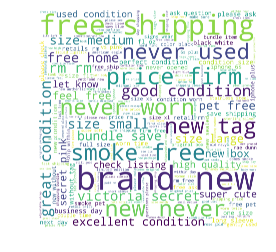

In [64]:
from wordcloud import WordCloud

# Generate a word cloud image
wordcloud = WordCloud(background_color = "white", max_words = 200, width = 5000, height = 5000).generate(train['des_cleaned_o'].str.cat())
# Display the generated image:
# the matplotlib way:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [50]:
from sklearn.feature_extraction.text import TfidfVectorizer

tvec = TfidfVectorizer(min_df = .0025, max_df = .1, stop_words = 'english', ngram_range = (1,3))
tvec_weights = tvec.fit_transform(train['item_description'].dropna())
weights = np.asarray(tvec_weights.mean(axis=0)).ravel().tolist()
weights_df = pd.DataFrame({'term': tvec.get_feature_names(), 'weight': weights})
weights_df.sort_values(by='weight', ascending=False).head(50)

,term,weight
304,description,0.056495
461,great,0.021037
876,rm,0.019900
113,black,0.018759
454,good,0.017040
997,small,0.016340
805,price,0.016131
136,box,0.015382
575,like,0.015049
162,bundle,0.014751


In [51]:
high_tvec_weights = tvec.fit_transform(train.query('price >= 50')['item_description'].dropna())
high_weights = np.asarray(high_tvec_weights.mean(axis=0)).ravel().tolist()
high_weights_df = pd.DataFrame({'term': tvec.get_feature_names(), 'weight': high_weights})
high_weights_df.sort_values(by='weight', ascending=False).head(50)

,term,weight
351,description,0.038165
1190,tags,0.016361
104,bag,0.015822
1049,shipping,0.015564
644,like,0.015399
501,good,0.015186
259,color,0.014559
436,firm,0.014538
509,great condition,0.014024
1107,small,0.013636


In [52]:
low_tvec_weights = tvec.fit_transform(train.query('price < 50')['item_description'].dropna())
low_weights = np.asarray(low_tvec_weights.mean(axis=0)).ravel().tolist()
low_weights_df = pd.DataFrame({'term': tvec.get_feature_names(), 'weight': low_weights})
low_weights_df.sort_values(by='weight', ascending=False).head(50)

,term,weight
304,description,0.058706
460,great,0.020863
869,rm,0.019497
113,black,0.018517
453,good,0.017239
986,small,0.016634
798,price,0.015502
162,bundle,0.015096
569,like,0.014977
777,pink,0.014633


## price x item_description

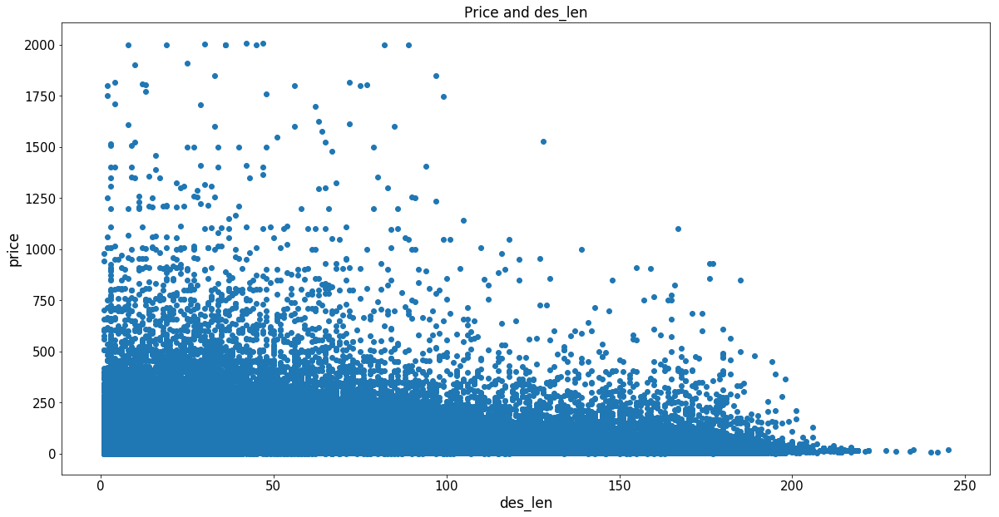

In [53]:
plt.figure(figsize=(20, 10))
plt.scatter(train['des_len'],train['price'])
plt.xlabel('des_len', fontsize=17)
plt.ylabel('price', fontsize=17)
plt.title('Price and des_len', fontsize=17)
plt.tick_params(labelsize=15)
plt.show()

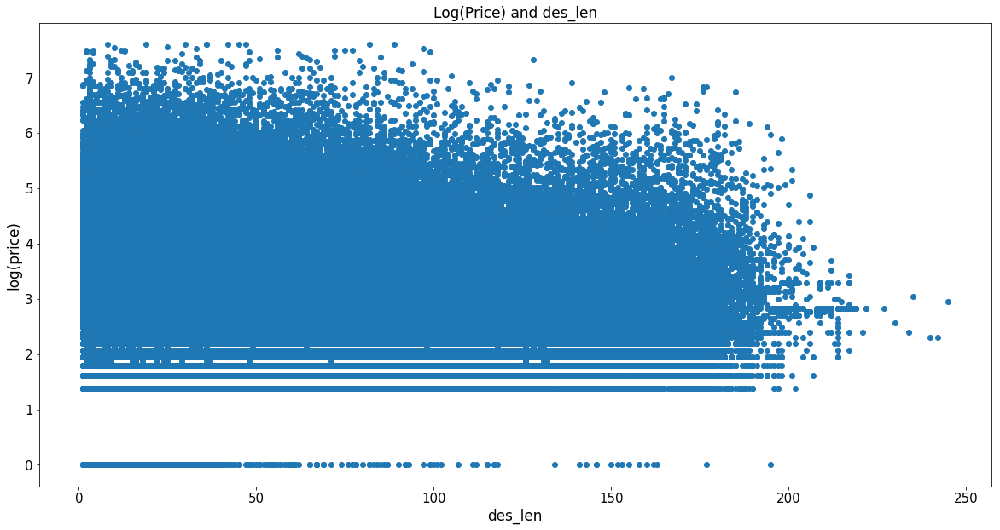

In [54]:
plt.figure(figsize=(20, 10))
plt.scatter(train['des_len'],np.log(train['price']+1))
plt.xlabel('des_len', fontsize=17)
plt.ylabel('log(price)', fontsize=17)
plt.title('Log(Price) and des_len', fontsize=17)
plt.tick_params(labelsize=15)
plt.show()

## 描述、價格及運費的關係
### 沒太多差異

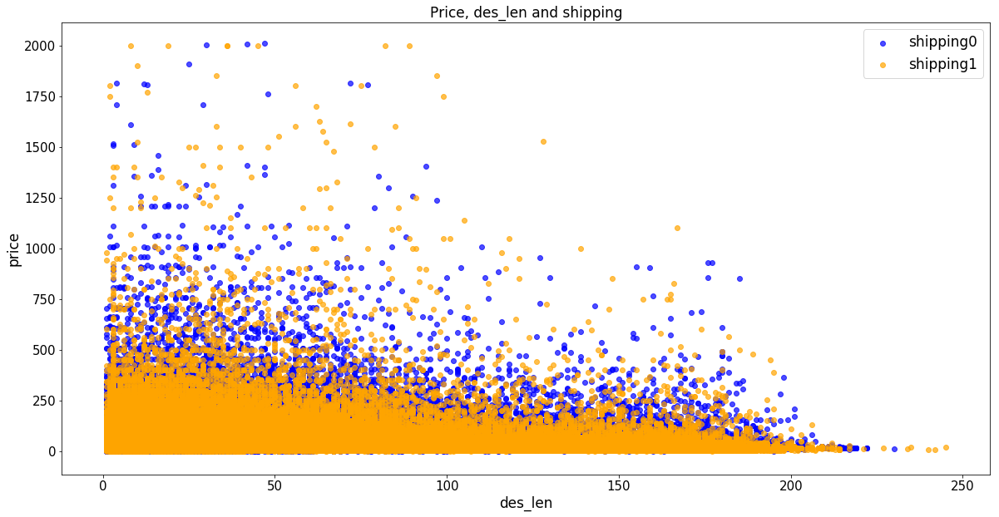

In [67]:
plt.figure(figsize=(20, 10))
plt.scatter(train.query('shipping == 0')['des_len'],train.query('shipping == 0')['price'], color='blue', alpha=0.7)
plt.scatter(train.query('shipping == 1')['des_len'],train.query('shipping == 1')['price'], color='orange', alpha=0.7)
plt.xlabel('des_len', fontsize=17)
plt.ylabel('price', fontsize=17)
plt.legend(('shipping0', 'shipping1'), fontsize=17)
plt.title('Price, des_len and shipping', fontsize=17)
plt.tick_params(labelsize=15)
plt.show()

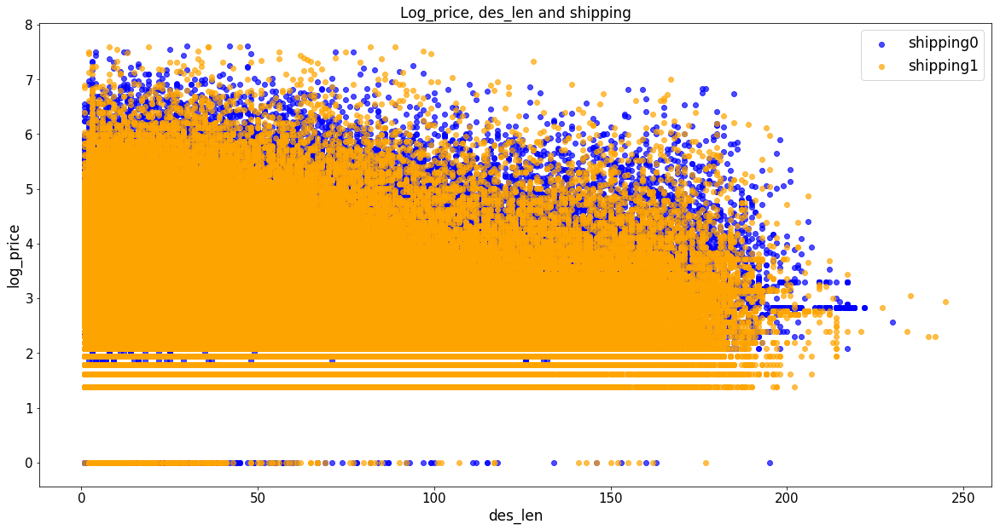

In [52]:
plt.figure(figsize=(20, 10))
plt.scatter(train.query('shipping == 0')['des_len'],train.query('shipping == 0')['log_price'], color='blue', alpha=0.7)
plt.scatter(train.query('shipping == 1')['des_len'],train.query('shipping == 1')['log_price'], color='orange', alpha=0.7)
plt.xlabel('des_len', fontsize=17)
plt.ylabel('log_price', fontsize=17)
plt.legend(('shipping0', 'shipping1'), fontsize=17)
plt.title('Log_price, des_len and shipping', fontsize=17)
plt.tick_params(labelsize=15)
plt.show()

## 各種類(i)及物品狀況關係

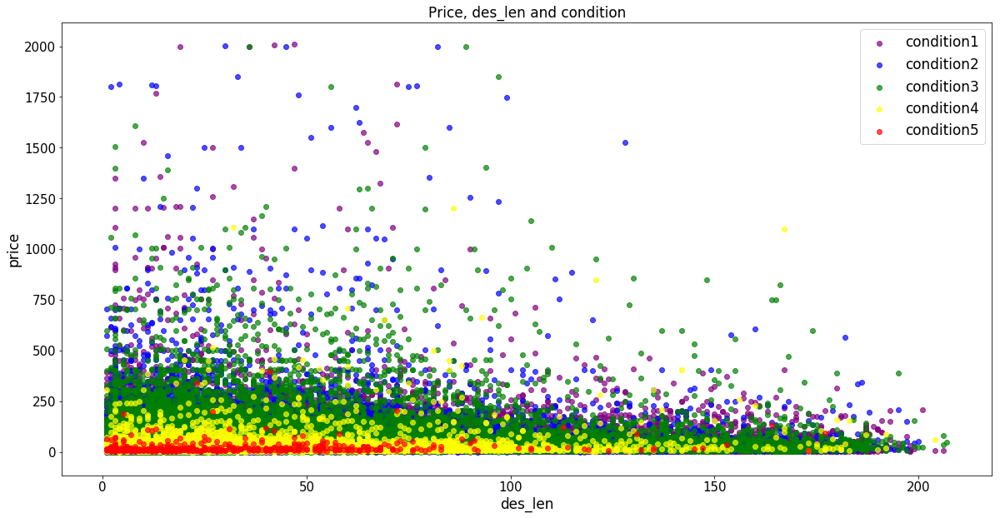

In [213]:
i = "\"Women\""

plt.figure(figsize=(20, 10))
plt.scatter(train.query('item_condition_id == 1 & cat1 == '+i)['des_len'],train.query('item_condition_id == 1 & cat1 == '+i)['price'], color='purple', alpha=0.7)
plt.scatter(train.query('item_condition_id == 2 & cat1 == '+i)['des_len'],train.query('item_condition_id == 2 & cat1 == '+i)['price'], color='blue', alpha=0.7)
plt.scatter(train.query('item_condition_id == 3 & cat1 == '+i)['des_len'],train.query('item_condition_id == 3 & cat1 == '+i)['price'], color='green', alpha=0.7)
plt.scatter(train.query('item_condition_id == 4 & cat1 == '+i)['des_len'],train.query('item_condition_id == 4 & cat1 == '+i)['price'], color='yellow', alpha=0.7)
plt.scatter(train.query('item_condition_id == 5 & cat1 == '+i)['des_len'],train.query('item_condition_id == 5 & cat1 == '+i)['price'], color='red', alpha=0.7)
plt.xlabel('des_len', fontsize=17)
plt.ylabel('price', fontsize=17)
plt.legend(('condition1', 'condition2', 'condition3', 'condition4', 'condition5'), fontsize=17)
plt.title('Price, des_len and condition', fontsize=17)
plt.tick_params(labelsize=15)
plt.show()

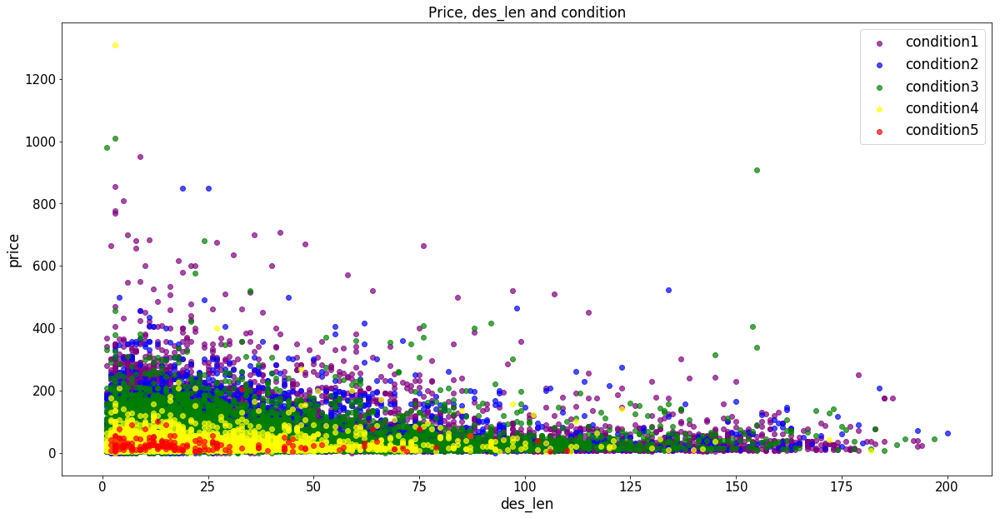

In [282]:
i = "\"Men\""

plt.figure(figsize=(20, 10))
plt.scatter(train.query('item_condition_id == 1 & cat1 == '+i)['des_len'],train.query('item_condition_id == 1 & cat1 == '+i)['price'], color='purple', alpha=0.7)
plt.scatter(train.query('item_condition_id == 2 & cat1 == '+i)['des_len'],train.query('item_condition_id == 2 & cat1 == '+i)['price'], color='blue', alpha=0.7)
plt.scatter(train.query('item_condition_id == 3 & cat1 == '+i)['des_len'],train.query('item_condition_id == 3 & cat1 == '+i)['price'], color='green', alpha=0.7)
plt.scatter(train.query('item_condition_id == 4 & cat1 == '+i)['des_len'],train.query('item_condition_id == 4 & cat1 == '+i)['price'], color='yellow', alpha=0.7)
plt.scatter(train.query('item_condition_id == 5 & cat1 == '+i)['des_len'],train.query('item_condition_id == 5 & cat1 == '+i)['price'], color='red', alpha=0.7)
plt.xlabel('des_len', fontsize=17)
plt.ylabel('price', fontsize=17)
plt.legend(('condition1', 'condition2', 'condition3', 'condition4', 'condition5'), fontsize=17)
plt.title('Price, des_len and condition', fontsize=17)
plt.tick_params(labelsize=15)
plt.show()

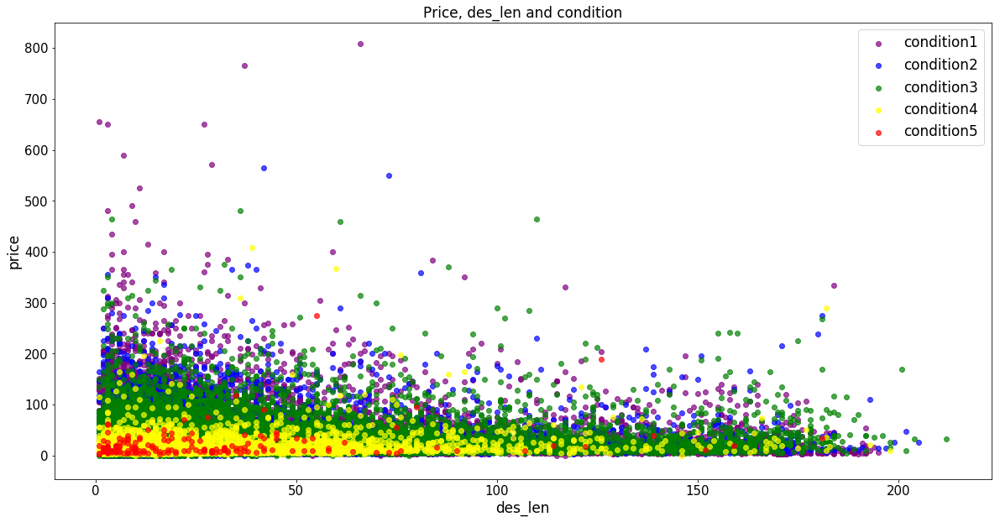

In [283]:
i = "\"Kids\""

plt.figure(figsize=(20, 10))
plt.scatter(train.query('item_condition_id == 1 & cat1 == '+i)['des_len'],train.query('item_condition_id == 1 & cat1 == '+i)['price'], color='purple', alpha=0.7)
plt.scatter(train.query('item_condition_id == 2 & cat1 == '+i)['des_len'],train.query('item_condition_id == 2 & cat1 == '+i)['price'], color='blue', alpha=0.7)
plt.scatter(train.query('item_condition_id == 3 & cat1 == '+i)['des_len'],train.query('item_condition_id == 3 & cat1 == '+i)['price'], color='green', alpha=0.7)
plt.scatter(train.query('item_condition_id == 4 & cat1 == '+i)['des_len'],train.query('item_condition_id == 4 & cat1 == '+i)['price'], color='yellow', alpha=0.7)
plt.scatter(train.query('item_condition_id == 5 & cat1 == '+i)['des_len'],train.query('item_condition_id == 5 & cat1 == '+i)['price'], color='red', alpha=0.7)
plt.xlabel('des_len', fontsize=17)
plt.ylabel('price', fontsize=17)
plt.legend(('condition1', 'condition2', 'condition3', 'condition4', 'condition5'), fontsize=17)
plt.title('Price, des_len and condition', fontsize=17)
plt.tick_params(labelsize=15)
plt.show()

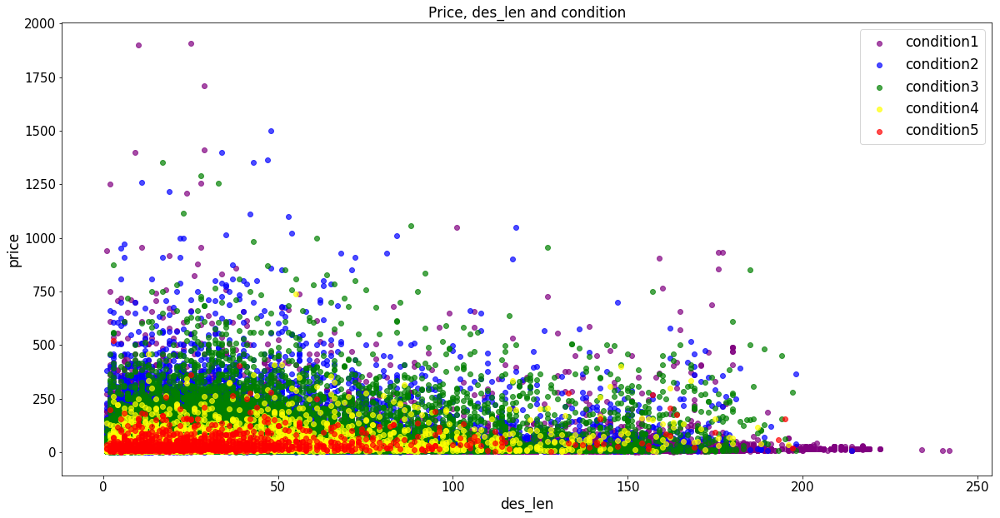

In [284]:
i = "\"Electronics\""

plt.figure(figsize=(20, 10))
plt.scatter(train.query('item_condition_id == 1 & cat1 == '+i)['des_len'],train.query('item_condition_id == 1 & cat1 == '+i)['price'], color='purple', alpha=0.7)
plt.scatter(train.query('item_condition_id == 2 & cat1 == '+i)['des_len'],train.query('item_condition_id == 2 & cat1 == '+i)['price'], color='blue', alpha=0.7)
plt.scatter(train.query('item_condition_id == 3 & cat1 == '+i)['des_len'],train.query('item_condition_id == 3 & cat1 == '+i)['price'], color='green', alpha=0.7)
plt.scatter(train.query('item_condition_id == 4 & cat1 == '+i)['des_len'],train.query('item_condition_id == 4 & cat1 == '+i)['price'], color='yellow', alpha=0.7)
plt.scatter(train.query('item_condition_id == 5 & cat1 == '+i)['des_len'],train.query('item_condition_id == 5 & cat1 == '+i)['price'], color='red', alpha=0.7)
plt.xlabel('des_len', fontsize=17)
plt.ylabel('price', fontsize=17)
plt.legend(('condition1', 'condition2', 'condition3', 'condition4', 'condition5'), fontsize=17)
plt.title('Price, des_len and condition', fontsize=17)
plt.tick_params(labelsize=15)
plt.show()

### Item_condition & price

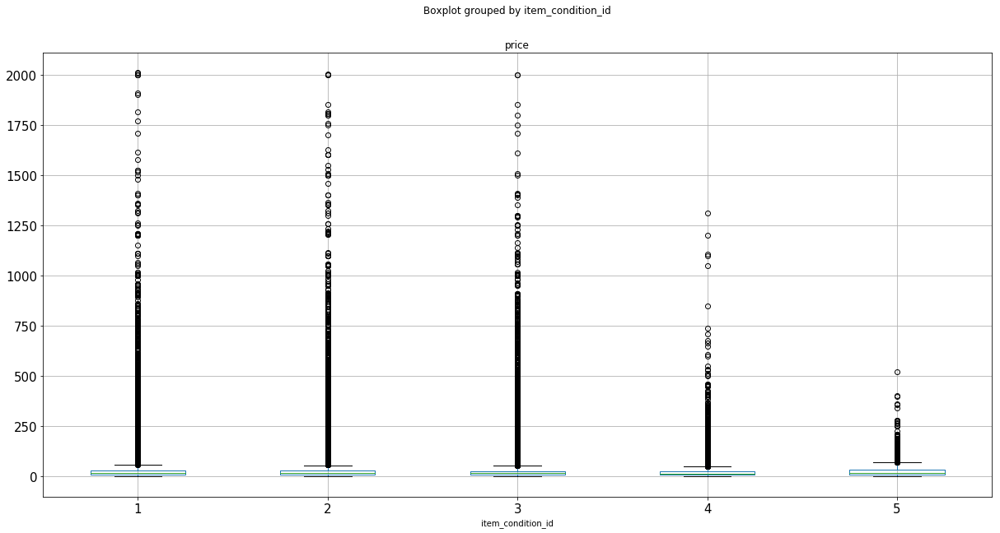

In [4]:
train.boxplot(column='price', by='item_condition_id', figsize=(20,10))
plt.tick_params(labelsize=15)
plt.show()

In [6]:
train.groupby("item_condition_id").price.describe()

,count,mean,std,min,25%,50%,75%,max
item_condition_id,,,,,,,,
1,640549.0,26.486967,35.418024,0.0,10.0,18.0,30.00,2009.0
2,375479.0,27.563225,42.125698,0.0,11.0,17.0,29.00,2004.0
3,432161.0,26.540711,40.030681,0.0,11.0,16.0,28.00,2000.0
4,31962.0,24.349212,35.679148,0.0,10.0,15.0,26.00,1309.0
5,2384.0,31.703859,39.531069,0.0,11.0,19.0,35.25,522.0


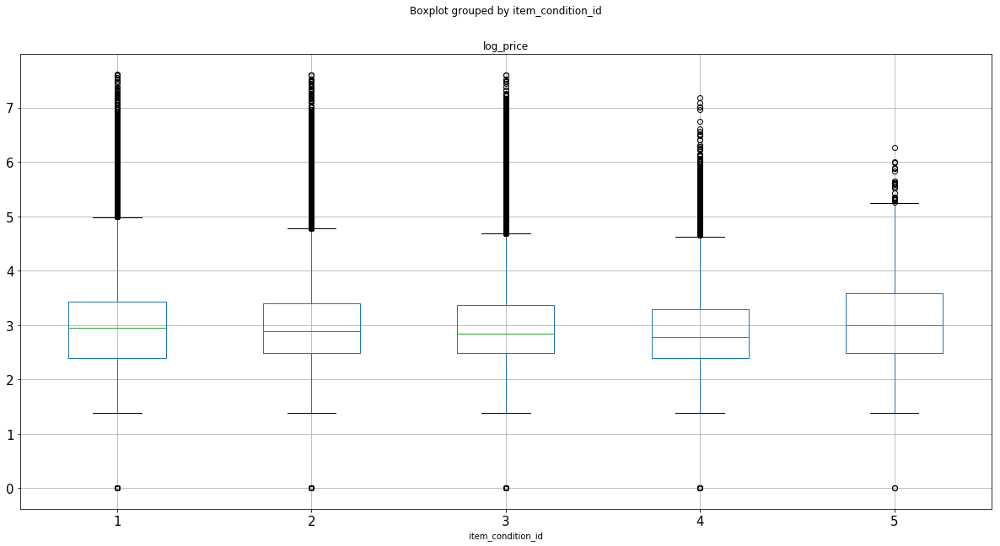

In [53]:
train.boxplot(column='log_price', by='item_condition_id', figsize=(20,10))
plt.tick_params(labelsize=15)
plt.show()

### Item condition x category(Men/Women/Kids/Electronics) 

In [55]:
ca_list = ["Women","Men","Kids","Electronics"]
t_g = train.groupby("cat1")
new_dict = dict()
for key in ca_list:
    new_dict[key] = t_g.get_group(key)
new_df = pd.concat([new_dict[i] for i in ca_list],axis = 0)
new_df = new_df.groupby(["item_condition_id","cat1"])


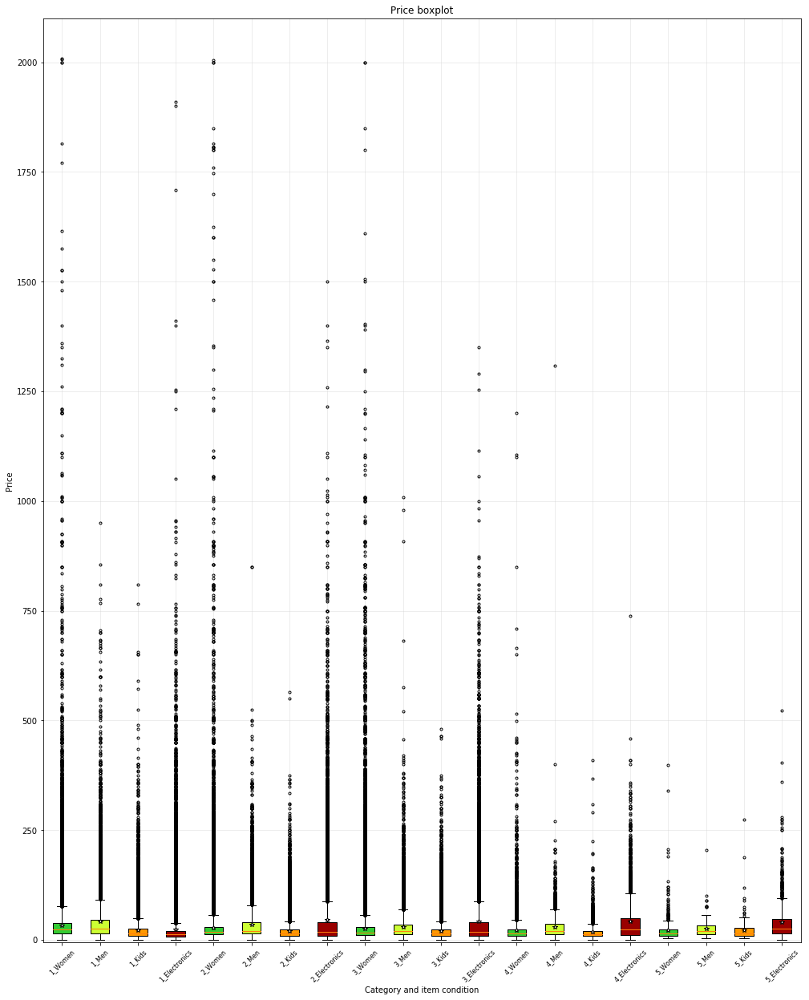

In [129]:
#  reference :https://matplotlib.org/examples/pylab_examples/boxplot_demo2.html
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon


# Generate some data from five different probability distributions,
# each with different characteristics. We want to play with how an IID
# bootstrap resample of the data preserves the distributional
# properties of the original sample, and a boxplot is one visual tool
# to make this assessment
numDists = 20
item_c = [1,2,3,4,5]
catt = ["Women","Men","Kids","Electronics"]
randomDists = [('%s_%s' % (i,j))for i in item_c for j in catt ]

data =[new_df.get_group((i, j))["price"] for i in item_c for j in catt]

fig, ax1 = plt.subplots(figsize=(15, 20))
fig.canvas.set_window_title('A Boxplot Example')
plt.subplots_adjust(left=0.075, right=0.95, top=0.9, bottom=0.1)

bp = plt.boxplot(data, notch=0, sym='+', vert=1, whis=1.5)
plt.setp(bp['boxes'], color='black')
plt.setp(bp['whiskers'], color='black')
plt.setp(bp['fliers'], color='red', marker='.')

# Add a horizontal grid to the plot, but make it very light in color
# so we can use it for reading data values but not be distracting
ax1.yaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)
ax1.xaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)

# Hide these grid behind plot objects
ax1.set_axisbelow(True)
ax1.set_title('Price boxplot')
ax1.set_xlabel('Category and item condition')
ax1.set_ylabel('Price')

# Now fill the boxes with desired colors
boxColors = ['#33cc33', '#ccff33' , '#ff9900',"#990000"]
numBoxes = numDists
medians = list(range(numBoxes))
for i in range(numBoxes):
    box = bp['boxes'][i]
    boxX = []
    boxY = []
    for j in range(5):
        boxX.append(box.get_xdata()[j])
        boxY.append(box.get_ydata()[j])
    boxCoords = list(zip(boxX, boxY))
    # Alternate between three boxColors
    k = i % 4
    boxPolygon = Polygon(boxCoords, facecolor=boxColors[k])
    ax1.add_patch(boxPolygon)
    # Now draw the median lines back over what we just filled in
    med = bp['medians'][i]
    medianX = []
    medianY = []
    for j in range(1):
        medianX.append(med.get_xdata()[j])
        medianY.append(med.get_ydata()[j])
        plt.plot(medianX, medianY, 'k')
        medians[i] = medianY[0]
    # Finally, overplot the sample averages, with horizontal alignment
    # in the center of each box
    plt.plot([np.average(med.get_xdata())], [np.average(data[i])],
             color='w', marker='*', markeredgecolor='k')

# Set the axes ranges and axes labels
ax1.set_xlim(0.5, numBoxes + 0.5)
top = 2100
bottom = -5
ax1.set_ylim(bottom, top)
xtickNames = plt.setp(ax1, xticklabels=np.repeat(randomDists, 1))
plt.setp(xtickNames, rotation=45, fontsize=8)

# Due to the Y-axis scale being different across samples, it can be
# hard to compare differences in medians across the samples. Add upper
# X-axis tick labels with the sample medians to aid in comparison
# (just use two decimal places of precision)
# pos = np.arange(numBoxes) + 1
# upperLabels = [str(np.round(s, 2)) for s in medians]
# weights = ['bold', 'semibold']
# for tick, label in zip(range(numBoxes), ax1.get_xticklabels()):
#     k = 1
#     ax1.text(pos[tick], top - (top*0.05), upperLabels[tick],
#              horizontalalignment='center', size=20, weight=weights[k],
#              color=boxColors[k])


plt.show()

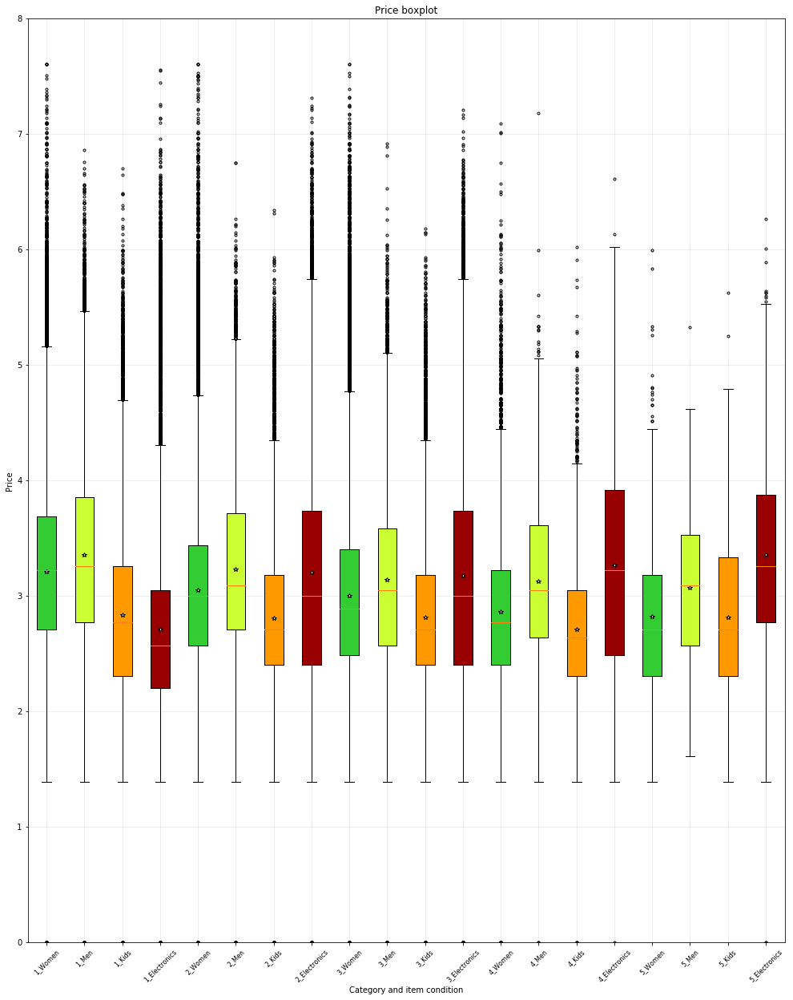

In [59]:
#  reference :https://matplotlib.org/examples/pylab_examples/boxplot_demo2.html
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon


# Generate some data from five different probability distributions,
# each with different characteristics. We want to play with how an IID
# bootstrap resample of the data preserves the distributional
# properties of the original sample, and a boxplot is one visual tool
# to make this assessment
numDists = 20
item_c = [1,2,3,4,5]
catt = ["Women","Men","Kids","Electronics"]
randomDists = [('%s_%s' % (i,j))for i in item_c for j in catt ]

data =[new_df.get_group((i, j))["log_price"] for i in item_c for j in catt]

fig, ax1 = plt.subplots(figsize=(15, 20))
fig.canvas.set_window_title('A Boxplot Example')
plt.subplots_adjust(left=0.075, right=0.95, top=0.9, bottom=0.1)

bp = plt.boxplot(data, notch=0, sym='+', vert=1, whis=1.5)
plt.setp(bp['boxes'], color='black')
plt.setp(bp['whiskers'], color='black')
plt.setp(bp['fliers'], color='red', marker='.')

# Add a horizontal grid to the plot, but make it very light in color
# so we can use it for reading data values but not be distracting
ax1.yaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)
ax1.xaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)

# Hide these grid behind plot objects
ax1.set_axisbelow(True)
ax1.set_title('Price boxplot')
ax1.set_xlabel('Category and item condition')
ax1.set_ylabel('Price')

# Now fill the boxes with desired colors
boxColors = ['#33cc33', '#ccff33' , '#ff9900',"#990000"]
numBoxes = numDists
medians = list(range(numBoxes))
for i in range(numBoxes):
    box = bp['boxes'][i]
    boxX = []
    boxY = []
    for j in range(5):
        boxX.append(box.get_xdata()[j])
        boxY.append(box.get_ydata()[j])
    boxCoords = list(zip(boxX, boxY))
    # Alternate between three boxColors
    k = i % 4
    boxPolygon = Polygon(boxCoords, facecolor=boxColors[k])
    ax1.add_patch(boxPolygon)
    # Now draw the median lines back over what we just filled in
    med = bp['medians'][i]
    medianX = []
    medianY = []
    for j in range(1):
        medianX.append(med.get_xdata()[j])
        medianY.append(med.get_ydata()[j])
        plt.plot(medianX, medianY, 'k')
        medians[i] = medianY[0]
    # Finally, overplot the sample averages, with horizontal alignment
    # in the center of each box
    plt.plot([np.average(med.get_xdata())], [np.average(data[i])],
             color='w', marker='*', markeredgecolor='k')

# Set the axes ranges and axes labels
ax1.set_xlim(0.5, numBoxes + 0.5)
top = 8
bottom = 0
ax1.set_ylim(bottom, top)
xtickNames = plt.setp(ax1, xticklabels=np.repeat(randomDists, 1))
plt.setp(xtickNames, rotation=45, fontsize=8)

# Due to the Y-axis scale being different across samples, it can be
# hard to compare differences in medians across the samples. Add upper
# X-axis tick labels with the sample medians to aid in comparison
# (just use two decimal places of precision)
# pos = np.arange(numBoxes) + 1
# upperLabels = [str(np.round(s, 2)) for s in medians]
# weights = ['bold', 'semibold']
# for tick, label in zip(range(numBoxes), ax1.get_xticklabels()):
#     k = 1
#     ax1.text(pos[tick], top - (top*0.05), upperLabels[tick],
#              horizontalalignment='center', size=20, weight=weights[k],
#              color=boxColors[k])


plt.show()

In [123]:
train[(train["cat1"]=="Electronics")].describe()

,train_id,item_condition_id,price,shipping,des_len
count,1.226900e+05,122690.000000,122690.000000,122690.000000,122690.000000
mean,7.411861e+05,1.971693,35.173922,0.584171,32.890178
std,4.281539e+05,0.969860,65.419784,0.492866,39.771211
min,1.000000e+00,1.000000,0.000000,0.000000,1.000000
25%,3.712088e+05,1.000000,9.000000,0.000000,7.000000
50%,7.395840e+05,2.000000,15.000000,1.000000,17.000000
75%,1.113994e+06,3.000000,31.000000,1.000000,40.000000
max,1.482522e+06,5.000000,1909.000000,1.000000,242.000000


In [131]:
train[(train["cat1"]=='Women')]["cat2"].unique()

array(['Tops & Blouses', 'Jewelry', 'Other', 'Swimwear', 'Dresses',
       'Shoes', 'Athletic Apparel', 'Jeans', 'Underwear',
       "Women's Handbags", 'Coats & Jackets', 'Pants', 'Sweaters',
       'Maternity', "Women's Accessories", 'Skirts', 'Suits & Blazers'], dtype=object)

In [132]:
train[(train["cat1"]=='Men')]["cat2"].unique()

array(['Tops', 'Shoes', 'Athletic Apparel', 'Coats & Jackets',
       "Men's Accessories", 'Sweats & Hoodies', 'Shorts', 'Jeans', 'Other',
       'Sweaters', 'Pants', 'Swimwear', 'Suits', 'Blazers & Sport Coats'], dtype=object)

In [133]:
train[(train["cat1"]=='Kids')]["cat2"].unique()

array(['Gear', 'Toys', 'Girls (4+)', 'Boys 0-24 Mos', 'Girls 0-24 Mos',
       'Boys (4+)', 'Girls 2T-5T', 'Boys 2T-5T', 'Car Seats & Accessories',
       'Diapering', 'Feeding', 'Health & Baby Care', 'Nursery', 'Other',
       'Safety', 'Strollers', 'Pregnancy & Maternity',
       'Bathing & Skin Care', 'Potty Training'], dtype=object)

In [142]:
train.groupby("cat1")["cat1"].count().sort_values(ascending=False)

cat1
Women                     664385
Beauty                    207828
Kids                      171689
Electronics               122690
Men                        93680
Home                       67871
Vintage & Collectibles     46530
Other                      45351
Handmade                   30842
Sports & Outdoors          25342
Name: cat1, dtype: int64

In [146]:
train.groupby("cat2")["cat2"].count().sort_values(ascending=False)[:20]

cat2
Athletic Apparel             134383
Makeup                       124624
Tops & Blouses               106960
Shoes                        100452
Jewelry                       61763
Toys                          58158
Cell Phones & Accessories     53290
Women's Handbags              45862
Dresses                       45758
Women's Accessories           42350
Jeans                         36130
Video Games & Consoles        35971
Sweaters                      35752
Underwear                     33784
Skin Care                     29838
Home Décor                    25188
Fragrance                     24294
Kitchen & Dining              21954
Tops                          20591
Other                         20017
Name: cat2, dtype: int64

### 有沒有new或nwt等字眼出現在description中與價格的關係

In [245]:
def NWT_label(x):
    if "new"in x:
        return 1
    elif "tags" in x:
        return 1
    elif "nwt" in x :
        return 1
    else:
        return 0
train["new_tag"] = train.apply(lambda x: NWT_label(x["des_cleaned"]), axis=1)

In [249]:
train.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o,new_tag
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3,"['description', 'yet']",description yet,0
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36,"['keyboard', 'great', 'condition', 'works', 'l...",keyboard great condition works like came box p...,0
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29,"['adorable', 'top', 'hint', 'lace', 'key', 'ho...",adorable top hint lace key hole back pale pink...,0
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32,"['new', 'tags', 'leather', 'horses', 'retail',...",new tags leather horses retail rm stand foot h...,1
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5,"['complete', 'certificate', 'authenticity']",complete certificate authenticity,0


In [259]:
train.groupby("cat1").describe()["shipping"]

,count,mean,std,min,25%,50%,75%,max
cat1,,,,,,,,
Beauty,207828.0,0.609653,0.487829,0.0,0.0,1.0,1.0,1.0
Electronics,122690.0,0.584171,0.492866,0.0,0.0,1.0,1.0,1.0
Handmade,30842.0,0.612152,0.487267,0.0,0.0,1.0,1.0,1.0
Home,67871.0,0.284687,0.451269,0.0,0.0,0.0,1.0,1.0
Kids,171689.0,0.409199,0.491688,0.0,0.0,0.0,1.0,1.0
Men,93680.0,0.343478,0.474872,0.0,0.0,0.0,1.0,1.0
Other,45351.0,0.535975,0.498710,0.0,0.0,1.0,1.0,1.0
Sports & Outdoors,25342.0,0.442664,0.496712,0.0,0.0,0.0,1.0,1.0
Vintage & Collectibles,46530.0,0.557920,0.496639,0.0,0.0,1.0,1.0,1.0


In [263]:
train.groupby("cat1").describe()["new_tag"]

,count,mean,std,min,25%,50%,75%,max
cat1,,,,,,,,
Beauty,207828.0,0.488904,0.499878,0.0,0.0,0.0,1.0,1.0
Electronics,122690.0,0.351651,0.477487,0.0,0.0,0.0,1.0,1.0
Handmade,30842.0,0.317813,0.465634,0.0,0.0,0.0,1.0,1.0
Home,67871.0,0.364102,0.481181,0.0,0.0,0.0,1.0,1.0
Kids,171689.0,0.285807,0.451799,0.0,0.0,0.0,1.0,1.0
Men,93680.0,0.320367,0.466620,0.0,0.0,0.0,1.0,1.0
Other,45351.0,0.339574,0.473570,0.0,0.0,0.0,1.0,1.0
Sports & Outdoors,25342.0,0.367019,0.482001,0.0,0.0,0.0,1.0,1.0
Vintage & Collectibles,46530.0,0.246207,0.430805,0.0,0.0,0.0,0.0,1.0


In [271]:
train.groupby(["cat1","new_tag"]).price.mean()

cat1                    new_tag
Beauty                  0          19.133435
                        1          20.234061
Electronics             0          34.071883
                        1          37.205788
Handmade                0          17.662690
                        1          19.216690
Home                    0          23.234146
                        1          26.811306
Kids                    0          19.637365
                        1          23.153546
Men                     0          32.461558
                        1          39.475560
Other                   0          20.050883
                        1          22.285844
Sports & Outdoors       0          24.135278
                        1          27.941458
Vintage & Collectibles  0          26.782731
                        1          29.043820
Women                   0          26.459611
                        1          33.600854
Name: price, dtype: float64

In [267]:
ca_list = ["Women","Men","Kids","Electronics"]
t_g = train.groupby("cat1")
new_dict = dict()
for key in ca_list:
    new_dict[key] = t_g.get_group(key)
new_df = pd.concat([new_dict[i] for i in ca_list],axis = 0)
new_df = new_df.groupby(["new_tag","cat1"])
new_df.groups.keys()


dict_keys([(0, 'Women'), (0, 'Men'), (0, 'Electronics'), (1, 'Kids'), (1, 'Electronics'), (1, 'Men'), (0, 'Kids'), (1, 'Women')])

## new/nwt 是否在description出現 與 價格

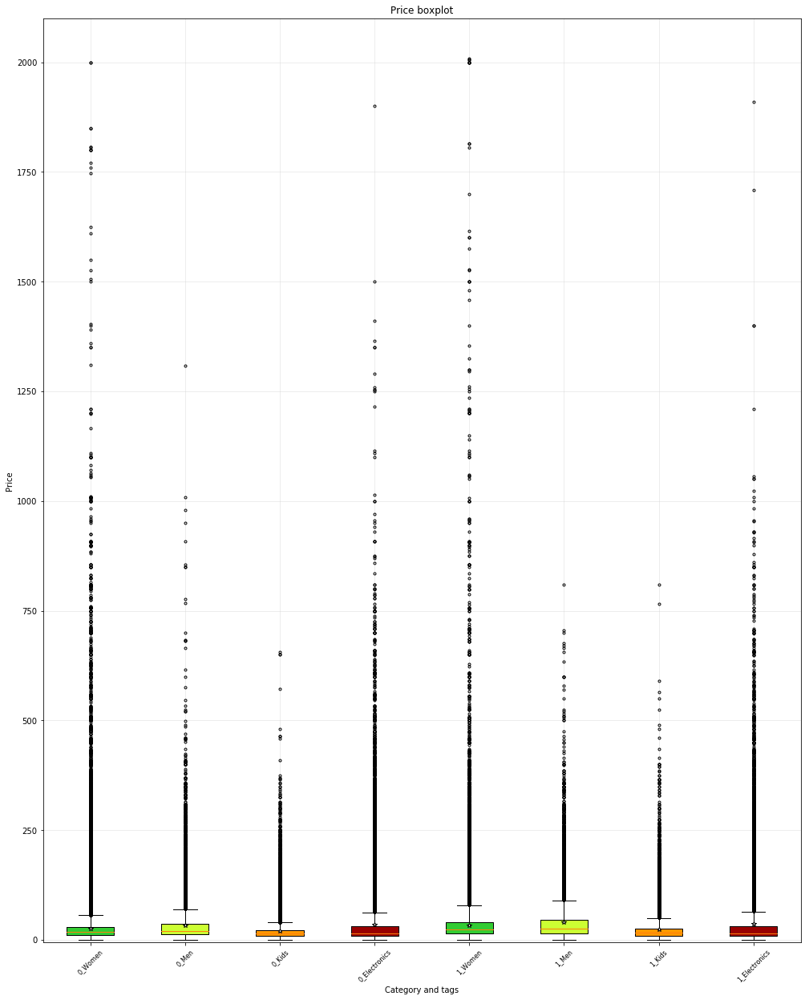

In [269]:
#  reference :https://matplotlib.org/examples/pylab_examples/boxplot_demo2.html
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon


# Generate some data from five different probability distributions,
# each with different characteristics. We want to play with how an IID
# bootstrap resample of the data preserves the distributional
# properties of the original sample, and a boxplot is one visual tool
# to make this assessment
numDists = 8
new_or_not = [0,1]
catt = ["Women","Men","Kids","Electronics"]
randomDists = [('%s_%s' % (i,j))for i in new_or_not for j in catt ]

data =[new_df.get_group((i, j))["price"] for i in new_or_not for j in catt]

fig, ax1 = plt.subplots(figsize=(15, 20))
fig.canvas.set_window_title('A Boxplot Example')
plt.subplots_adjust(left=0.075, right=0.95, top=0.9, bottom=0.1)

bp = plt.boxplot(data, notch=0, sym='+', vert=1, whis=1.5)
plt.setp(bp['boxes'], color='black')
plt.setp(bp['whiskers'], color='black')
plt.setp(bp['fliers'], color='red', marker='.')

# Add a horizontal grid to the plot, but make it very light in color
# so we can use it for reading data values but not be distracting
ax1.yaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)
ax1.xaxis.grid(True, linestyle='-', which='major', color='lightgrey',
               alpha=0.5)

# Hide these grid behind plot objects
ax1.set_axisbelow(True)
ax1.set_title('Price boxplot')
ax1.set_xlabel('Category and tags')
ax1.set_ylabel('Price')

# Now fill the boxes with desired colors
boxColors = ['#33cc33', '#ccff33' , '#ff9900',"#990000"]
numBoxes = numDists
medians = list(range(numBoxes))
for i in range(numBoxes):
    box = bp['boxes'][i]
    boxX = []
    boxY = []
    for j in range(5):
        boxX.append(box.get_xdata()[j])
        boxY.append(box.get_ydata()[j])
    boxCoords = list(zip(boxX, boxY))
    # Alternate between three boxColors
    k = i % 4
    boxPolygon = Polygon(boxCoords, facecolor=boxColors[k])
    ax1.add_patch(boxPolygon)
    # Now draw the median lines back over what we just filled in
    med = bp['medians'][i]
    medianX = []
    medianY = []
    for j in range(1):
        medianX.append(med.get_xdata()[j])
        medianY.append(med.get_ydata()[j])
        plt.plot(medianX, medianY, 'k')
        medians[i] = medianY[0]
    # Finally, overplot the sample averages, with horizontal alignment
    # in the center of each box
    plt.plot([np.average(med.get_xdata())], [np.average(data[i])],
             color='w', marker='*', markeredgecolor='k')

# Set the axes ranges and axes labels
ax1.set_xlim(0.5, numBoxes + 0.5)
top = 2100
bottom = -5
ax1.set_ylim(bottom, top)
xtickNames = plt.setp(ax1, xticklabels=np.repeat(randomDists, 1))
plt.setp(xtickNames, rotation=45, fontsize=8)

# Due to the Y-axis scale being different across samples, it can be
# hard to compare differences in medians across the samples. Add upper
# X-axis tick labels with the sample medians to aid in comparison
# (just use two decimal places of precision)
# pos = np.arange(numBoxes) + 1
# upperLabels = [str(np.round(s, 2)) for s in medians]
# weights = ['bold', 'semibold']
# for tick, label in zip(range(numBoxes), ax1.get_xticklabels()):
#     k = 1
#     ax1.text(pos[tick], top - (top*0.05), upperLabels[tick],
#              horizontalalignment='center', size=20, weight=weights[k],
#              color=boxColors[k])


plt.show()

t(9)= -5.403 , p<0.01

## 保固是否出現在描述中

In [272]:
def Warrant_label(x):
    if "warrant" in x:
        return 1
    elif "warranty" in x:
        return 1
    elif "maintain" in x:
        return 1
    elif "maintenance" in x:
        return 1
    else:
        return 0
train["warrant"] = train.apply(lambda x: Warrant_label(x["des_cleaned"]), axis=1)

In [274]:
train["warrant"].describe()

count    1.482535e+06
mean     1.824577e-03
std      4.267610e-02
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+00
Name: warrant, dtype: float64

### 電器類有無保固相差最大，其他類別也都有差異[1]，不過有寫的是少數[2]

In [275]:
train.groupby(["cat1","warrant"])['price'].mean()

cat1                    warrant
Beauty                  0           19.654293
                        1           26.403013
Electronics             0           34.761957
                        1          109.976190
Handmade                0           18.080456
                        1           60.763636
Home                    0           24.495588
                        1           37.090498
Kids                    0           20.627843
                        1           42.234783
Men                     0           34.661198
                        1           59.338889
Other                   0           20.753858
                        1           34.697802
Sports & Outdoors       0           25.486875
                        1           34.829268
Vintage & Collectibles  0           27.330728
                        1           40.387097
Women                   0           28.864256
                        1           52.781356
Name: price, dtype: float64

In [276]:
train.groupby(["cat1","warrant"])['price'].count()

cat1                    warrant
Beauty                  0          207297
                        1             531
Electronics             0          122018
                        1             672
Handmade                0           30787
                        1              55
Home                    0           67650
                        1             221
Kids                    0          171574
                        1             115
Men                     0           93500
                        1             180
Other                   0           45169
                        1             182
Sports & Outdoors       0           25219
                        1             123
Vintage & Collectibles  0           46499
                        1              31
Women                   0          663795
                        1             590
Name: price, dtype: int64

## 查詢超高單價物品是那些

In [216]:
train.query('price >1900').sort_values("price",ascending=False)

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o,des_len_level,cat_new_level,new_category
760469,760469,NEW Chanel WOC Caviar Gold Hardware,1,Women/Women's Handbags/Shoulder Bag,Chanel,2009.0,0,"New with tag, box and dustbag but no receipt. ...",Women,Women's Handbags,Shoulder Bag,47,"['new', 'tag', 'box', 'dustbag', 'receipt'...",new tag box dustbag receipt dark purple color ...,1,0,Women
1262245,1262245,NEW-Chanel Boy Wallet o Chain WOC Caviar,1,Women/Women's Handbags/Messenger & Crossbody,Chanel,2006.0,0,Brand: Chanel Style: WOC Boy Wallet on Chain T...,Women,Women's Handbags,Messenger & Crossbody,42,"['brand', 'chanel', 'style', 'woc', 'boy',...",brand chanel style woc boy wallet chain type c...,1,0,Women
1393600,1393600,David Yurman Wheaton ring,2,Women/Jewelry/Rings,David Yurman,2004.0,0,David Yurman Wheaton wing. Size 6. Original re...,Women,Jewelry,Rings,30,"['david', 'yurman', 'wheaton', 'wing', 'si...",david yurman wheaton wing size 6 original rece...,1,0,Women
415027,415027,Chanel Classic Jumbo Single flap bag,3,Women/Women's Handbags/Shoulder Bag,Chanel,2000.0,1,Authentic. Pre-loved in Excellent Condition. P...,Women,Women's Handbags,Shoulder Bag,36,"['authentic', 'pre', 'loved', 'excellent', ...",authentic pre loved excellent condition pen ma...,1,0,Women
742113,742113,Chanel Chevron Fuschia Pink 2,1,Women/Women's Handbags/Shoulder Bag,Chanel,2000.0,1,Authentic Brand new The price for this is [rm]...,Women,Women's Handbags,Shoulder Bag,19,"['authentic', 'brand', 'new', 'price', 'rm...",authentic brand new price rm must purchase lis...,0,0,Women
778940,778940,Mary kay,1,Beauty/Makeup/Face,Mary Kay,2000.0,1,30 time wise sets Oily to combo skin,Beauty,Makeup,Face,8,"['30', 'time', 'wise', 'sets', 'oily', 'c...",30 time wise sets oily combo skin,0,0,Beauty
956343,956343,Chanel Black wallet on chain,1,Women/Women's Handbags/Messenger & Crossbody,Chanel,2000.0,1,Lambskin Color is Black with dark Silver Hardw...,Women,Women's Handbags,Messenger & Crossbody,36,"['lambskin', 'color', 'black', 'dark', 'si...",lambskin color black dark silver hardware made...,1,0,Women
1250053,1250053,Brand New Chanel CC Quilted WOC,2,Women/Women's Handbags/Messenger & Crossbody,Chanel,2000.0,1,This is a brand new Chanel CC Quilted Wallet o...,Women,Women's Handbags,Messenger & Crossbody,45,"['brand', 'new', 'chanel', 'cc', 'quilted'...",brand new chanel cc quilted wallet chain cavia...,1,0,Women
1445348,1445348,Vs2/I 1ct Diamond Engagement Ring,2,Women/Jewelry/Rings,NaN,2000.0,1,Absolutely stunning diamond engagement ring Pu...,Women,Jewelry,Rings,82,"['absolutely', 'stunning', 'diamond', 'enga...",absolutely stunning diamond engagement ring pu...,2,0,Women
952000,952000,Chanel J12 H0682 Wrist Watch for Women,3,Women/Women's Accessories/Watches,NaN,1999.0,1,"HELLO , I HAVE A BLACK CHANEL WATCH J12 CERAMI...",Women,Women's Accessories,Watches,89,"['hello', 'black', 'chanel', 'watch', 'j12...",hello black chanel watch j12 ceramic 2000 mode...,3,0,Women


In [303]:
len(train.query('price >1900')["train_id"])

11

In [319]:
train[(train["brand_name"]=="Chanel")].groupby("cat2").price.mean().sort_values()

cat2
Dresses                 18.000000
Collectibles            19.500000
Makeup                  25.784360
Tops                    27.166667
Tops & Blouses          28.297297
Bath & Body             30.800000
Suits & Blazers         32.000000
Accessories             32.083333
Tools & Accessories     34.067797
Skin Care               35.142857
Other                   35.208333
Athletic Apparel        44.000000
Sweaters                44.230769
Swimwear                45.000000
Jewelry                 45.958848
Fragrance               47.468182
Men's Accessories       60.857143
Coats & Jackets         67.000000
Women's Accessories     75.758621
Shoes                  141.636364
Bags and Purses        177.000000
Women's Handbags       196.729443
Name: price, dtype: float64

In [321]:
train[(train["brand_name"]=="Chanel")].groupby("cat2").price.count().sort_values()

cat2
Collectibles             2
Dresses                  2
Swimwear                 2
Suits & Blazers          3
Coats & Jackets          4
Bath & Body              5
Tops                     6
Men's Accessories        7
Athletic Apparel         8
Accessories             12
Sweaters                13
Bags and Purses         17
Other                   24
Tops & Blouses          37
Tools & Accessories     59
Skin Care               63
Shoes                  110
Jewelry                243
Women's Accessories    261
Women's Handbags       377
Makeup                 422
Fragrance              660
Name: price, dtype: int64

In [328]:
train.query('cat1== "Electronics"').groupby("cat3").price.mean().sort_values(ascending=False).plot.box

cat3
Laptops & Netbooks               177.089176
Desktops & All-In-Ones           149.329412
Digital Cameras                  112.305349
Cell Phones & Smartphones        109.109508
Consoles                          90.155144
Lenses & Filters                  82.832487
Car Subwoofers                    76.095238
iPad                              73.583851
Home Surveillance                 73.241176
Flashes & Flash Accessories       70.636364
Car Security & Convenience        62.777778
Camera & Photo Accessories        60.591296
Home Audio                        58.934211
Camcorders                        57.008772
Televisions                       54.985185
Home Speakers & Subwoofers        51.778082
Car Speakers & Systems            49.966667
Car Stereos & Components          44.801527
Lighting & Studio                 44.560976
Headphones                        44.253470
Components & Parts                42.913900
Gadgets                           42.693842
Printers, Scanners & Suppli

(0, 200)

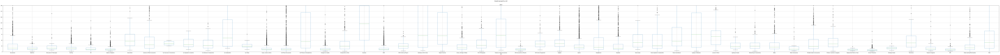

In [337]:
train.query('cat1== "Electronics" & item_condition_id != 4 & item_condition_id != 5 & item_condition_id != 3 ').boxplot(column='price', by='cat3', figsize=(200,10)).set_ylim(0,200)

In [358]:
a=train.query('cat1== "Electronics"')
# 'cat1== "Electronics" & item_condition_id != 4 & item_condition_id != 5 & item_condition_id != 3
train.query('cat1== "Electronics"').price.describe()

count    122690.000000
mean         35.173922
std          65.419784
min           0.000000
25%           9.000000
50%          15.000000
75%          31.000000
max        1909.000000
Name: price, dtype: float64

In [361]:
sTd = a.price.std()
MeaN = a.price.mean()

In [362]:
MeaN+2*sTd

166.0134905953621

## 查詢比兩倍標準差價個還貴的電器類產品

In [371]:
b=train.query('cat1== "Electronics" & price >= (166.013)')

In [372]:
b.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o,new_tag,warrant
22,22,Galaxy S7 Edge (Unlocked) 32GB,3,Electronics/Cell Phones & Accessories/Cell Pho...,Samsung,386.0,0,"Reasonable offers welcomed. But if you ask ""lo...",Electronics,Cell Phones & Accessories,Cell Phones & Smartphones,60,"['reasonable', 'offers', 'welcomed', 'ask', 'l...",reasonable offers welcomed ask lowest lowball ...,1,0
38,38,XBOX One,3,Electronics/Video Games & Consoles/Consoles,Xbox,226.0,0,500GB Comes with power cord One controller wit...,Electronics,Video Games & Consoles,Consoles,28,"['500gb', 'comes', 'power', 'cord', 'one', 'co...",500gb comes power cord one controller recharge...,0,0
1330,1330,iPhone 6 64gb Gold (Sprint),3,Electronics/Cell Phones & Accessories/Cell Pho...,Apple,305.0,1,Fully functional iPhone 6 64gb Rose Gold. Only...,Electronics,Cell Phones & Accessories,Cell Phones & Smartphones,51,"['fully', 'functional', 'iphone', '6', '64gb',...",fully functional iphone 6 64gb rose gold cosme...,0,0
1536,1536,iPhone 6 Plus,2,Electronics/Cell Phones & Accessories/Cell Pho...,Apple,310.0,1,iPhone 6 Plus US Cellular. Clean ESN. Excellen...,Electronics,Cell Phones & Accessories,Cell Phones & Smartphones,33,"['iphone', '6', 'plus', 'us', 'cellular', 'cle...",iphone 6 plus us cellular clean esn excellent ...,1,0
1624,1624,Apple Watch 38mm,2,Electronics/Cell Phones & Accessories/Cell Pho...,Apple,206.0,0,Just like new. I have the original box as well,Electronics,Cell Phones & Accessories,Cell Phones & Smartphones,10,"['like', 'new', 'original', 'box', 'well']",like new original box well,1,0


### 超貴電器類大部分都是APPLE的產品

In [373]:
b["brand_name"].value_counts().head(10)

Apple        2383
Nintendo      364
Samsung       358
Sony          287
Xbox          180
Canon         161
Nikon          88
Microsoft      76
Beats          53
Bose           50
Name: brand_name, dtype: int64

In [370]:
b=train.query('cat1== "Electronics" & price < (166.013)')
b["brand_name"].value_counts().head(10)

Apple               14881
Nintendo            13315
Sony                 7231
Xbox                 5182
Samsung              3697
Beats                1196
PopSockets           1095
Beats by Dr. Dre      968
Fuji                  963
LG                    768
Name: brand_name, dtype: int64

### Beats有分家， Beats == Beats by Dr. Dre

In [375]:
c=train.query('cat1== "Electronics" & brand_name=="Beats" | brand_name=="Beats by Dr. Dre"')
c.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o,new_tag,warrant
1961,1961,Beats solo 2,2,"Electronics/TV, Audio & Surveillance/Headphones",Beats,60.0,1,I used these for a week. I'm more of a regular...,Electronics,"TV, Audio & Surveillance",Headphones,25,"['used', 'week', 'regular', 'iphone', 'headpho...",used week regular iphone headphone girl lol th...,0,0
2719,2719,White Powerbeats2 Wireless Beats By Dre,1,"Electronics/TV, Audio & Surveillance/Headphones",Beats by Dr. Dre,60.0,1,Powerbeats2 Wireless earphones with RemoteTalk...,Electronics,"TV, Audio & Surveillance",Headphones,36,"['powerbeats2', 'wireless', 'earphones', 'remo...",powerbeats2 wireless earphones remotetalk wrap...,0,0
3089,3089,Dr. Drew Beats Extra Cord Wire,1,"Electronics/TV, Audio & Surveillance/Portable ...",Beats by Dr. Dre,8.0,1,This came with my Dr. Dre Solos but I don't ne...,Electronics,"TV, Audio & Surveillance",Portable Audio & Accessories,27,"['came', 'dr', 'dre', 'solos', 'need', 'make',...",came dr dre solos need make offer please consi...,0,0
3682,3682,New Beats ear headpones with mic,1,"Electronics/TV, Audio & Surveillance/Headphones",Beats,18.0,1,Brand new in box beats ear headpones with mic ...,Electronics,"TV, Audio & Surveillance",Headphones,33,"['brand', 'new', 'box', 'beats', 'ear', 'headp...",brand new box beats ear headpones mic problem ...,1,0
3730,3730,Beats By Dr. Dre Studios 2.0,3,"Electronics/TV, Audio & Surveillance/Headphones",Beats by Dr. Dre,99.0,0,"They work extremely well, I have had no proble...",Electronics,"TV, Audio & Surveillance",Headphones,77,"['work', 'extremely', 'well', 'problems', 'pur...",work extremely well problems purchased powerbe...,0,0


In [376]:
c.groupby("brand_name").price.describe()

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
Beats,1249.0,73.568455,47.507914,6.0,39.0,64.0,100.0,331.0
Beats by Dr. Dre,1015.0,69.953695,44.997094,3.0,39.5,60.0,86.0,360.0


### 沒有強調真品的描述

In [401]:
def authentic_label(x):
    try:
        if "authentic" in x:
            return 1
        else:
            return 0
    except:
        return 0
trains["authentic_lab"] = trains.apply(lambda x: authentic_label(x["des_cleaned"]), axis=1)

In [405]:
trains["authentic_lab"].describe()

count    1482535.0
mean           0.0
std            0.0
min            0.0
25%            0.0
50%            0.0
75%            0.0
max            0.0
Name: authentic_lab, dtype: float64

In [425]:
train['cat1'].value_counts()

Women                     664385
Beauty                    207828
Kids                      171689
Electronics               122690
Men                        93680
Home                       67871
Vintage & Collectibles     46530
Other                      45351
Handmade                   30842
Sports & Outdoors          25342
Name: cat1, dtype: int64

## 計算outlier種類

In [8]:
train.groupby("cat1").price.mean(),train.groupby("cat1").price.std()
Mean = train.groupby("cat1").price.mean()
Std = train.groupby("cat1").price.std()
outlier = pd.concat([Mean,Std],axis = 1)
outlier.columns=["Mean","Std"] #重新命名欄位

In [23]:
# 計算limit值
outlier = outlier.assign(limit =outlier["Mean"]+2*outlier["Std"])
outlier

,Mean,Std,limit
cat1,,,
Beauty,19.671536,21.360135,62.391807
Electronics,35.173922,65.419784,166.013491
Handmade,18.156572,27.758289,73.673149
Home,24.536599,24.417061,73.370721
Kids,20.642315,22.730876,66.104067
Men,34.708614,41.240057,117.188728
Other,20.809817,29.847758,80.505333
Sports & Outdoors,25.532219,29.302234,84.136686
Vintage & Collectibles,27.339426,53.507495,134.354416


In [103]:
def compar(x,y):
    try:
        if x >= y:
            return 1
        else:
            return 0
    except:
        return 0
category_out_list = dict()

train_gr = train.groupby("cat1")
for key in train_gr.groups.keys():
    cat_list = list()
    df = train_gr.get_group(key).groupby("cat3").price.mean()
    for i in range(len(df)):
        out_or_not = compar(df[i],outlier.loc[key,"limit"])
        cat_list.append([df.index[i],out_or_not])
    category_out_list[key] = cat_list
    

In [166]:
category_out = list()
for key in category_out_list.keys():
    for j in category_out_list[key]:
        if j[1] == 1:
            print(j)
            category_out.append(j[0])

['Furniture', 1]
['Handbag', 1]
['Clutch', 1]
['Music', 1]
['Laptops & Netbooks', 1]
['Air Conditioners', 1]
['Vacuums & Floor Care', 1]
['Electronics for Kids', 1]
['Joggers', 1]
['Lightweight', 1]
['Standard', 1]
['Travel Systems', 1]
['Electronics', 1]
["Women's Golf Clubs", 1]
['Brass Instruments', 1]
['Oils & Fluids', 1]
['Wind & Woodwind Instruments', 1]
['Satchel', 1]


In [167]:
category_out[0]

'Furniture'

In [168]:
def category_group(x,category_out):
    categoryout = category_out
    try:
        if x in categoryout:
            return 1
        else:
            return 0
    except:
        return 2
train["cat_new_level"] = train.apply(lambda x: category_group(x["cat3"],category_out),axis=1)
train.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o,des_len_level,cat_new_level
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3,"['description', 'yet']",description yet,0,0
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36,"['keyboard', 'great', 'condition', 'works',...",keyboard great condition works like came box p...,0,0
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29,"['adorable', 'top', 'hint', 'lace', 'key',...",adorable top hint lace key hole back pale pink...,0,0
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32,"['new', 'tags', 'leather', 'horses', 'reta...",new tags leather horses retail rm stand foot h...,0,0
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5,"['complete', 'certificate', 'authenticity']",complete certificate authenticity,0,0


In [170]:
train["cat_new_level"].value_counts()

0    1474540
1       7995
Name: cat_new_level, dtype: int64

In [172]:
def category_group_name(cat_new_level,category_main):
    try:
        cat = str()
        if cat_new_level == 1:
            cat = "outlier"
        elif cat_new_level == 0:
            cat = category_main
        return cat
    except:
        return 2
train["new_category"] = train.apply(lambda x: category_group_name(x["cat_new_level"],x["cat1"]),axis=1)
train.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o,des_len_level,cat_new_level,new_category
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3,"['description', 'yet']",description yet,0,0,Men
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36,"['keyboard', 'great', 'condition', 'works',...",keyboard great condition works like came box p...,0,0,Electronics
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29,"['adorable', 'top', 'hint', 'lace', 'key',...",adorable top hint lace key hole back pale pink...,0,0,Women
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32,"['new', 'tags', 'leather', 'horses', 'reta...",new tags leather horses retail rm stand foot h...,0,0,Home
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5,"['complete', 'certificate', 'authenticity']",complete certificate authenticity,0,0,Women


In [173]:
train["new_category"].value_counts()

Women                     662052
Beauty                    207828
Kids                      170791
Electronics               120907
Men                        93680
Home                       67613
Vintage & Collectibles     44686
Other                      44516
Handmade                   30824
Sports & Outdoors          25316
outlier                     7995
Name: new_category, dtype: int64

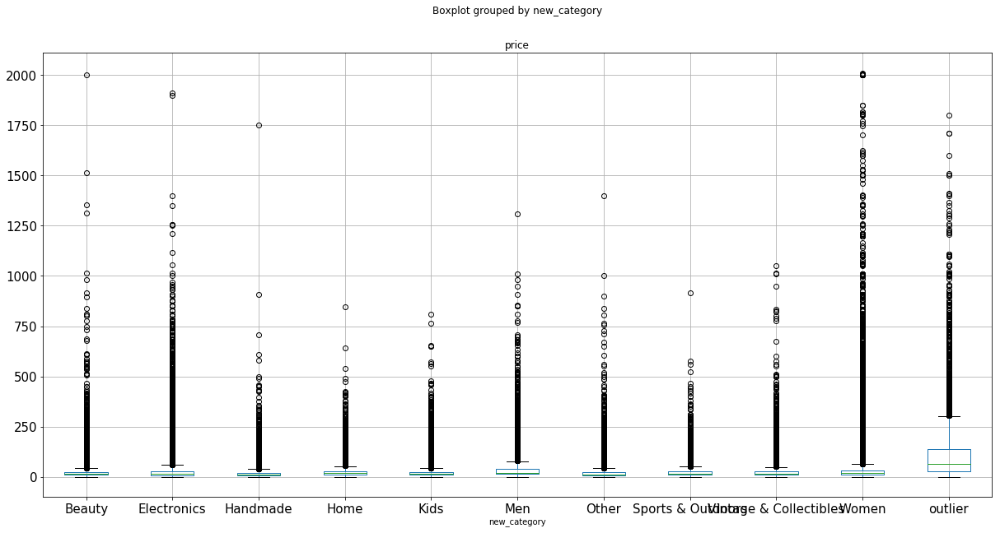

In [174]:
train.boxplot(column='price', by='new_category', figsize=(20,10))
plt.tick_params(labelsize=15)
plt.show()

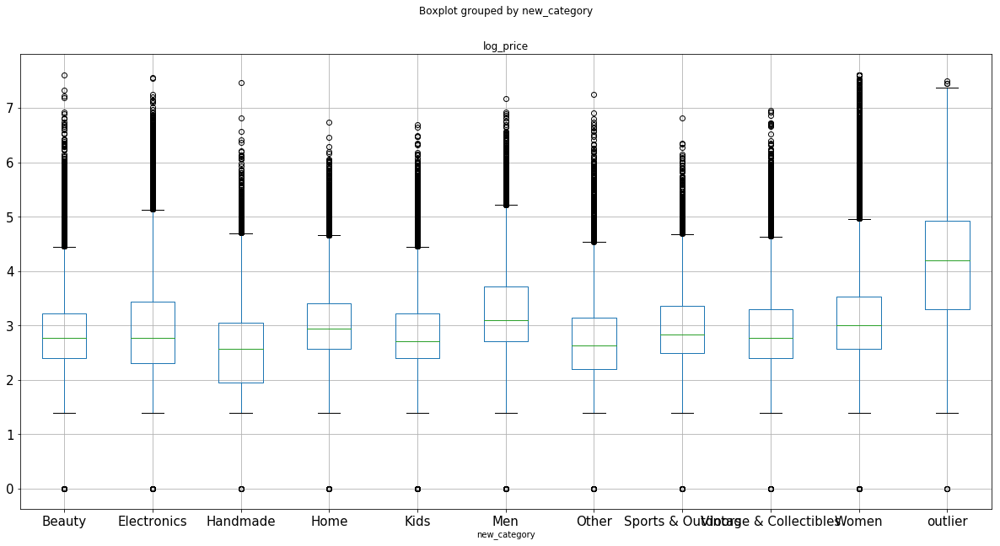

In [60]:
train.boxplot(column='log_price', by='new_category', figsize=(20,10))
plt.tick_params(labelsize=15)
plt.show()

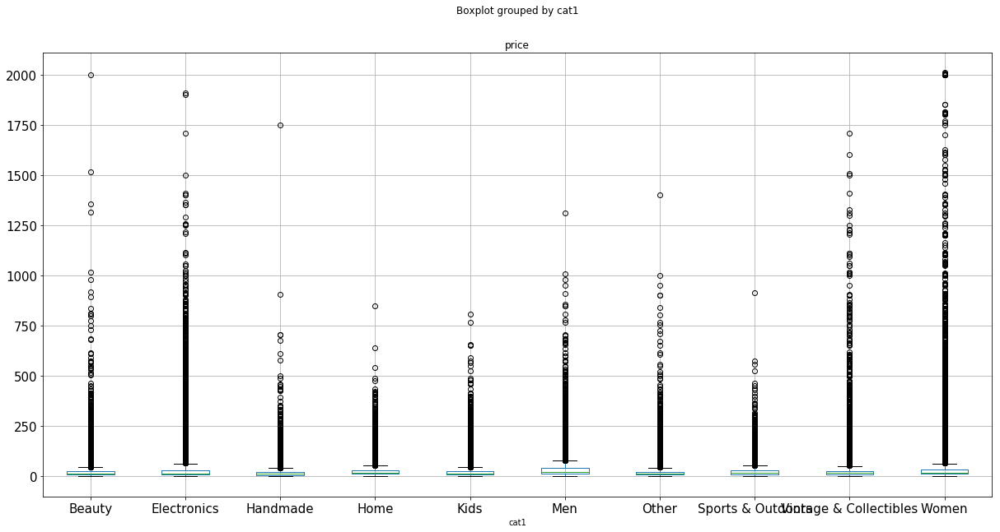

In [175]:
train.boxplot(column='price', by='cat1', figsize=(20,10))
plt.tick_params(labelsize=15)
plt.show()

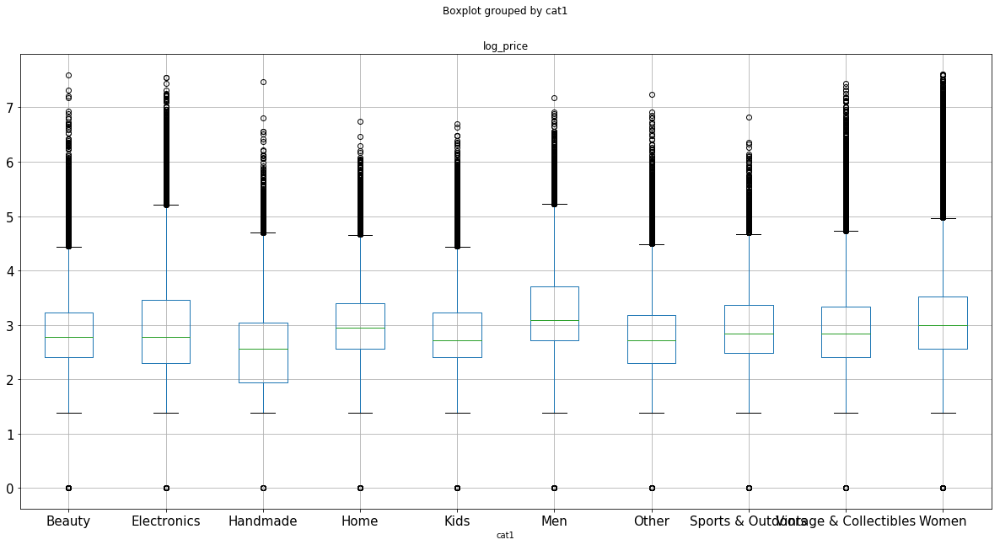

In [62]:
train.boxplot(column='log_price', by='cat1', figsize=(20,10))
plt.tick_params(labelsize=15)
plt.show()

### 字詞長度分級

In [156]:
train["des_len"].describe()

count    1.482535e+06
mean     2.568858e+01
std      3.039363e+01
min      1.000000e+00
25%      7.000000e+00
50%      1.500000e+01
75%      3.100000e+01
max      2.450000e+02
Name: des_len, dtype: float64

In [157]:
train["des_len"].describe()['50%']

15.0

In [ ]:
train["des_len"].value_counts().plot.bar()

In [162]:
train["des_len"].describe()["std"]

30.393627701182538

In [194]:
len_mean = train["des_len"].describe()["mean"]
len_std =train["des_len"].describe()["std"]
def compar_len(x,len_mean,len_std):
    standard1 = len_mean + 2*len_std
    standard2 = len_mean + len_std
    standard3 = len_mean 
    try:
        if x >= standard1:
            return 3
        elif x>= standard2:
            return 2
        elif x>= standard3:
            return 1
        else:
            return 0
    except:
        return 0
train["des_len_level"] = train.apply(lambda x: compar_len(x["des_len"],len_mean,len_std),axis=1)
train.head()


,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o,des_len_level,cat_new_level,new_category
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3,"['description', 'yet']",description yet,0,0,Men
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36,"['keyboard', 'great', 'condition', 'works',...",keyboard great condition works like came box p...,1,0,Electronics
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29,"['adorable', 'top', 'hint', 'lace', 'key',...",adorable top hint lace key hole back pale pink...,1,0,Women
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32,"['new', 'tags', 'leather', 'horses', 'reta...",new tags leather horses retail rm stand foot h...,1,0,Home
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5,"['complete', 'certificate', 'authenticity']",complete certificate authenticity,0,0,Women


In [195]:
train["des_len_level"].value_counts()

0    1019312
1     296613
2      85340
3      81270
Name: des_len_level, dtype: int64

In [196]:
train.groupby("des_len_level").describe().price

,count,mean,std,min,25%,50%,75%,max
des_len_level,,,,,,,,
0,1019312.0,25.040029,32.701702,0.0,10.0,16.0,28.0,2000.0
1,296613.0,30.458294,46.373898,0.0,12.0,19.0,33.0,2009.0
2,85340.0,32.674760,56.327269,0.0,11.0,19.0,34.0,2000.0
3,81270.0,28.213498,49.409858,0.0,10.0,16.0,28.0,1999.0


In [199]:
crosstable = pd.crosstab(train['item_condition_id'], train["new_category"])
crosstable['sum'] = crosstable.sum(axis=1)
crosstable.sort_values('sum', ascending=False)

new_category,Beauty,Electronics,Handmade,Home,Kids,Men,Other,Sports & Outdoors,Vintage & Collectibles,Women,outlier,sum
item_condition_id,,,,,,,,,,,,
1,149964,51956,19540,43251,57104,28861,27770,12144,18089,227431,2214,638324
3,25675,36809,4998,11176,70199,35321,8258,6880,13458,214341,3289,430404
2,30454,27489,5883,12507,38523,25836,7757,5718,11621,205632,1882,373302
4,1676,3531,386,631,4801,3491,675,557,1387,14156,514,31805
5,59,1122,17,48,164,171,56,17,131,492,96,2373


In [177]:
train.query('price <= 15').price.value_counts()

10.0    99416
12.0    78986
14.0    76655
9.0     63643
8.0     61564
15.0    58082
7.0     52268
11.0    39786
13.0    36800
6.0     32260
5.0     31502
3.0     18703
4.0     16139
0.0       874
10.5       38
12.5       34
7.5        34
5.5        33
8.5        20
9.5        17
6.5        16
14.5       13
11.5       13
13.5        4
Name: price, dtype: int64

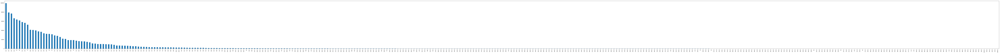

In [185]:
train.price.value_counts()[:1000].plot.bar(figsize=(200,10))

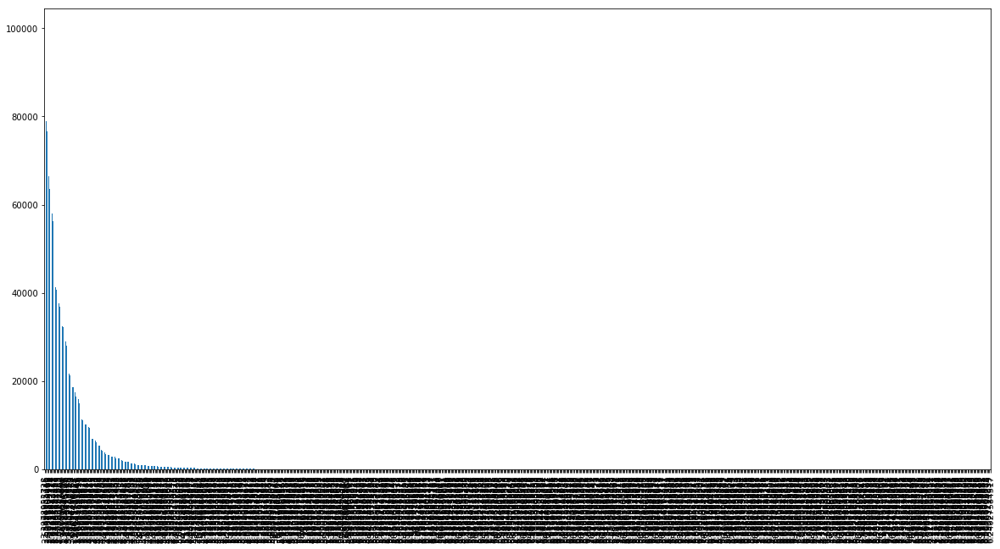

In [69]:
train.log_price.value_counts().plot.bar(figsize=(20,10))

In [183]:
train.price.value_counts()[20:100]

20.0     56323
7.0      52268
18.0     41243
24.0     40797
11.0     39786
19.0     37729
13.0     36800
26.0     33531
25.0     32450
6.0      32260
5.0      31502
21.0     28996
22.0     28012
30.0     25386
29.0     21793
17.0     21334
34.0     18816
36.0     18718
3.0      18703
31.0     17414
40.0     16545
4.0      16139
35.0     15943
28.0     14916
23.0     13720
39.0     11364
46.0     11141
44.0     10210
27.0     10173
45.0     10167
32.0      9704
50.0      9517
41.0      9362
56.0      8382
49.0      6902
38.0      6838
51.0      6688
54.0      6509
60.0      6221
33.0      5807
66.0      5355
55.0      5328
42.0      4487
65.0      4148
59.0      3950
61.0      3766
64.0      3469
37.0      3295
70.0      3213
76.0      3184
75.0      3000
71.0      2953
48.0      2887
69.0      2796
86.0      2794
80.0      2581
106.0     2473
100.0     2421
Name: price, dtype: int64

In [218]:
from sklearn.cross_validation import train_test_split

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [220]:
X = train.drop(["price"],axis=1).values, y = train["price"].values

ValueError: too many values to unpack (expected 2)

In [223]:
train_tr = train.sample(frac=0.8)
train_tr.head(),len(train_tr["train_id"])

(         train_id                                     name  item_condition_id  \
 1000646   1000646                         Jordan's retro 7                  3   
 338563     338563          Hot Pink Celestial Bodiez V Cut                  2   
 1169474   1169474  Lilly Pulitzer 2017-2018 Agenda/Planner                  3   
 1247541   1247541                       4 Pokémon EX cards                  2   
 1476578   1476578                Under armour headband set                  3   
 
                                           category_name    brand_name  price  \
 1000646                            Kids/Boys (4+)/Shoes          Nike   60.0   
 338563   Women/Athletic Apparel/Pants, Tights, Leggings           NaN   60.0   
 1169474           Other/Office supplies/School Supplies           NaN   21.0   
 1247541  Vintage & Collectibles/Trading Cards/Animation       Pokemon   14.0   
 1476578      Women/Women's Accessories/Hair Accessories  Under Armour    9.0   
 
          shipping

In [224]:
1186028/1476578

0.8032274624164791

In [225]:
train_v = train.loc[~train.index.isin(train_tr.index)]

In [226]:
len(train_v["train_id"])

296507

In [227]:
296507/1476578

0.20080686560411978

In [1]:
import os

In [ ]:
train = pd.read(")

In [4]:
train = pd.read_csv("資料處理/train_cleanedo.tsv",sep="\t",converters={'des_cleaned': lambda x: x[1:-1].split(',')})

In [5]:
train.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o,new_tag,warrant
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3,"['description', 'yet']",description yet,0,0
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36,"['keyboard', 'great', 'condition', 'works',...",keyboard great condition works like came box p...,0,0
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29,"['adorable', 'top', 'hint', 'lace', 'key',...",adorable top hint lace key hole back pale pink...,0,0
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32,"['new', 'tags', 'leather', 'horses', 'reta...",new tags leather horses retail rm stand foot h...,1,0
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5,"['complete', 'certificate', 'authenticity']",complete certificate authenticity,0,0


In [8]:
train.head()


,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o,new_tag,warrant,log_price
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3,"['description', 'yet']",description yet,0,0,2.397895
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36,"['keyboard', 'great', 'condition', 'works',...",keyboard great condition works like came box p...,0,0,3.970292
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29,"['adorable', 'top', 'hint', 'lace', 'key',...",adorable top hint lace key hole back pale pink...,0,0,2.397895
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32,"['new', 'tags', 'leather', 'horses', 'reta...",new tags leather horses retail rm stand foot h...,1,0,3.583519
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5,"['complete', 'certificate', 'authenticity']",complete certificate authenticity,0,0,3.806662


In [14]:
train.groupby("brand_name")["log_price"].describe().sort_values("count",ascending=False)

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
!iT Jeans,1.0,2.833213,NaN,2.833213,2.833213,2.833213,2.833213,2.833213
% Pure,61.0,2.733639,0.486595,1.791759,2.397895,2.708050,3.135494,4.094345
10.Deep,3.0,2.898948,0.169098,2.772589,2.802901,2.833213,2.962128,3.091042
191 Unlimited,1.0,3.610918,NaN,3.610918,3.610918,3.610918,3.610918,3.610918
1byone,1.0,3.951244,NaN,3.951244,3.951244,3.951244,3.951244,3.951244
21men,6.0,2.547858,0.276566,2.079442,2.439659,2.602003,2.739206,2.833213
24/7 Comfort Apparel,2.0,3.420273,1.445861,2.397895,2.909084,3.420273,3.931462,4.442651
2K Games,1.0,2.302585,NaN,2.302585,2.302585,2.302585,2.302585,2.302585
2XU,2.0,3.494668,0.085815,3.433987,3.464327,3.494668,3.525008,3.555348


In [15]:
train.groupby("brand_name")["log_price"].describe().sort_values("count",ascending=False)

,count,mean,std,min,25%,50%,75%,max
brand_name,,,,,,,,
PINK,54088.0,3.113480,0.585674,0.000000,2.708050,3.044522,3.465736,6.683361
Nike,54043.0,3.224269,0.656680,0.000000,2.708050,3.135494,3.663562,6.131226
Victoria's Secret,48036.0,3.005935,0.566114,0.000000,2.639057,2.995732,3.332205,7.244942
LuLaRoe,31024.0,3.421935,0.491327,0.000000,3.091042,3.401197,3.713572,5.860786
Apple,17322.0,3.468514,1.237373,0.000000,2.484907,3.135494,4.454347,7.554859
FOREVER 21,15186.0,2.543504,0.418384,0.000000,2.302585,2.564949,2.772589,5.198497
Nintendo,15007.0,3.167979,0.831647,0.000000,2.564949,3.044522,3.637586,6.398595
Lululemon,14558.0,3.703584,0.584444,0.000000,3.332205,3.688879,4.094345,6.568078
Michael Kors,13928.0,3.879297,0.750440,0.000000,3.332205,3.912023,4.430817,7.479300


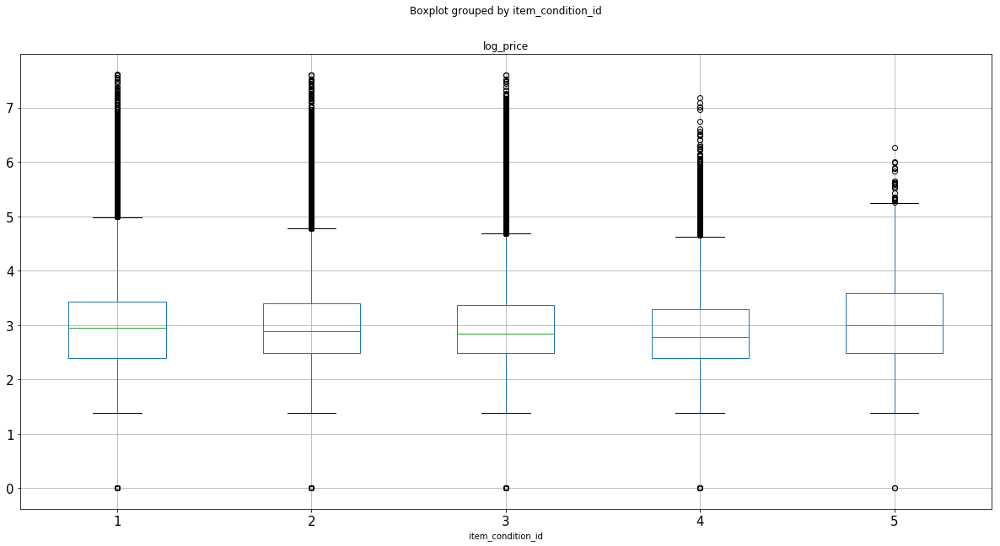

In [17]:
train.boxplot(column='log_price', by='item_condition_id', figsize=(20,10))
plt.tick_params(labelsize=15)
plt.show()

In [19]:
train.groupby("item_condition_id")["log_price"].describe().sort_values("count",ascending=False)

,count,mean,std,min,25%,50%,75%,max
item_condition_id,,,,,,,,
1,640549.0,2.972679,0.766628,0.0,2.397895,2.944439,3.433987,7.605890
3,432161.0,2.975196,0.725443,0.0,2.484907,2.833213,3.367296,7.601402
2,375479.0,3.000738,0.746726,0.0,2.484907,2.890372,3.401197,7.603399
4,31962.0,2.896014,0.725102,0.0,2.397895,2.772589,3.295837,7.177782
5,2384.0,3.092496,0.830604,0.0,2.484907,2.995732,3.590369,6.259581


# Text Processing - Item Description
The following section is based on the tutorial at https://ahmedbesbes.com/how-to-mine-newsfeed-data-and-extract-interactive-insights-in-python.html
## Pre-processing: tokenization
Most of the time, the first steps of an NLP project is to "tokenize" your documents, which main purpose is to normalize our texts. The three fundamental stages will usually include: <br/>

1.break the descriptions into sentences and then break the sentences into tokens <br/>
2.remove punctuation and stop words <br/>
3.lowercase the tokens <br/>

herein, I will also only consider words that have length equal to or greater than 3 characters

In [2]:
from nltk import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.corpus import stopwords
import re
import numpy as np
import pandas as pd
import string
from collections import Counter
from wordcloud import WordCloud

In [3]:
train = pd.read_csv("資料處理/train_feature.tsv",sep="\t",converters={'des_cleaned': lambda x: x[1:-1].split(',')})

In [4]:
test = pd.read_csv("資料處理/test_feature.tsv",sep="\t",converters={'des_cleaned': lambda x: x[1:-1].split(',')})

In [6]:
train.head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o,new_tag,warrant,cat_new_level,new_category,des_len_level
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3,"['description', 'yet']",description yet,0,0,0,Men,0
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36,"['keyboard', 'great', 'condition', 'works',...",keyboard great condition works like came box p...,0,0,0,Electronics,1
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29,"['adorable', 'top', 'hint', 'lace', 'key',...",adorable top hint lace key hole back pale pink...,0,0,0,Women,1
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32,"['new', 'tags', 'leather', 'horses', 'reta...",new tags leather horses retail rm stand foot h...,1,0,0,Home,1
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5,"['complete', 'certificate', 'authenticity']",complete certificate authenticity,0,0,0,Women,0


In [7]:
stop = set(stopwords.words('english'))
def tokenize(text):
    """
    sent_tokenize(): segment text into sentences
    word_tokenize(): break sentences into words
    """
    try: 
        regex = re.compile('[' +re.escape(string.punctuation) + '0-9\\r\\t\\n]')
        text = regex.sub(" ", text) # remove punctuation
        
        tokens_ = [word_tokenize(s) for s in sent_tokenize(text)]
        tokens = []
        for token_by_sent in tokens_:
            tokens += token_by_sent
        tokens = list(filter(lambda t: t.lower() not in stop, tokens))
        filtered_tokens = [w for w in tokens if re.search('[a-zA-Z]', w)]
        filtered_tokens = [w.lower() for w in filtered_tokens if len(w)>=3]
        
        return filtered_tokens
            
    except TypeError as e: print(text,e)

In [8]:
# apply the tokenizer into the item descriptipn column
train['tokens'] = train['item_description'].map(tokenize)

nan expected string or bytes-like object
nan expected string or bytes-like object
nan expected string or bytes-like object
nan expected string or bytes-like object


In [9]:
test['tokens'] = test['item_description'].map(tokenize)

In [9]:
train["cat1"].unique()

array(['Men', 'Electronics', 'Women', 'Home', 'Sports & Outdoors',
       'Vintage & Collectibles', 'Beauty', 'Other', 'Kids', nan, 'Handmade'], dtype=object)

In [10]:
train.groupby(["cat1"]).groups.keys()

dict_keys(['Beauty', 'Sports & Outdoors', 'Other', 'Home', 'Men', 'Women', 'Vintage & Collectibles', 'Kids', 'Electronics', 'Handmade'])

In [11]:
trainss = train.groupby(["cat1"])

In [10]:
train[(train["item_description"].notnull())].head()

,train_id,name,item_condition_id,category_name,brand_name,price,shipping,item_description,cat1,cat2,cat3,des_len,des_cleaned,des_cleaned_o,new_tag,warrant,cat_new_level,new_category,des_len_level,tokens
0,0,MLB Cincinnati Reds T Shirt Size XL,3,Men/Tops/T-shirts,NaN,10.0,1,No description yet,Men,Tops,T-shirts,3,"['description', 'yet']",description yet,0,0,0,Men,0,"[description, yet]"
1,1,Razer BlackWidow Chroma Keyboard,3,Electronics/Computers & Tablets/Components & P...,Razer,52.0,0,This keyboard is in great condition and works ...,Electronics,Computers & Tablets,Components & Parts,36,"['keyboard', 'great', 'condition', 'works',...",keyboard great condition works like came box p...,0,0,0,Electronics,1,"[keyboard, great, condition, works, like, came..."
2,2,AVA-VIV Blouse,1,Women/Tops & Blouses/Blouse,Target,10.0,1,Adorable top with a hint of lace and a key hol...,Women,Tops & Blouses,Blouse,29,"['adorable', 'top', 'hint', 'lace', 'key',...",adorable top hint lace key hole back pale pink...,0,0,0,Women,1,"[adorable, top, hint, lace, key, hole, back, p..."
3,3,Leather Horse Statues,1,Home/Home Décor/Home Décor Accents,NaN,35.0,1,New with tags. Leather horses. Retail for [rm]...,Home,Home Décor,Home Décor Accents,32,"['new', 'tags', 'leather', 'horses', 'reta...",new tags leather horses retail rm stand foot h...,1,0,0,Home,1,"[new, tags, leather, horses, retail, stand, fo..."
4,4,24K GOLD plated rose,1,Women/Jewelry/Necklaces,NaN,44.0,0,Complete with certificate of authenticity,Women,Jewelry,Necklaces,5,"['complete', 'certificate', 'authenticity']",complete certificate authenticity,0,0,0,Women,0,"[complete, certificate, authenticity]"


In [11]:
# build dictionary with key=category and values as all the descriptions related.
cat_desc = dict()
trainss = train[(train["item_description"].notnull())]
# for cat in trainss.groups.keys():   
#     text = " ".join((i for i in trains.get_group(cat)['item_description'].values if type(i) ==str)
#     cat_desc[cat] = tokenize(text)

for cat in  trainss.groupby(["cat1"]).groups.keys(): 
    text = " ".join(trainss.loc[trainss['cat1']==cat, 'item_description'].values)
    cat_desc[cat] = tokenize(text)



In [12]:
# find the most common words for the top 4 categories
women100 = Counter(cat_desc['Women']).most_common(100)
beauty100 = Counter(cat_desc['Beauty']).most_common(100)
kids100 = Counter(cat_desc['Kids']).most_common(100)
electronics100 = Counter(cat_desc['Electronics']).most_common(100)

In [13]:
women100[:10]

[('size', 289151),
 ('new', 195347),
 ('worn', 143940),
 ('condition', 133094),
 ('free', 110095),
 ('brand', 104559),
 ('black', 92351),
 ('small', 82213),
 ('shipping', 76315),
 ('pink', 75861)]

In [14]:
def generate_wordcloud(tup):
    wordcloud = WordCloud(background_color='white',
                          max_words=50, max_font_size=40,
                          random_state=42
                         ).generate(str(tup))
    return wordcloud

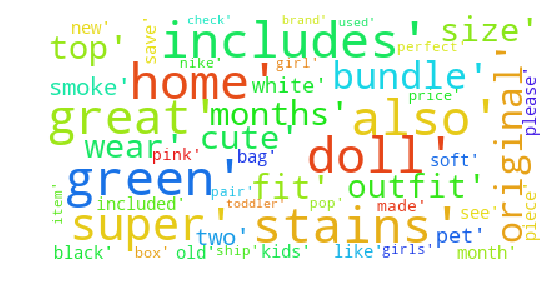

In [15]:
aaa =generate_wordcloud(kids100)
fig = plt.figure(figsize=(5,5), dpi=100)
ax = plt.axes([0,0,1,1])
plt.imshow(aaa, interpolation="nearest", aspect="equal")
plt.axis('off')
plt.show()

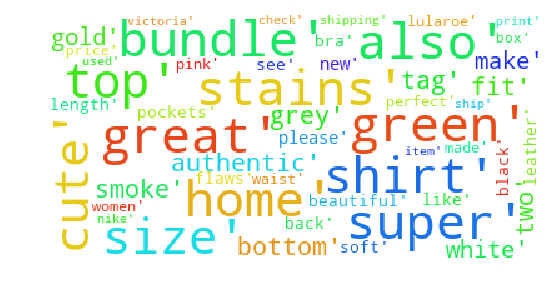

In [16]:
aaa =generate_wordcloud(women100)
fig = plt.figure(figsize=(5,5), dpi=100)
ax = plt.axes([0,0,1,1])
plt.imshow(aaa, interpolation="nearest", aspect="equal")
plt.axis('off')
plt.show()

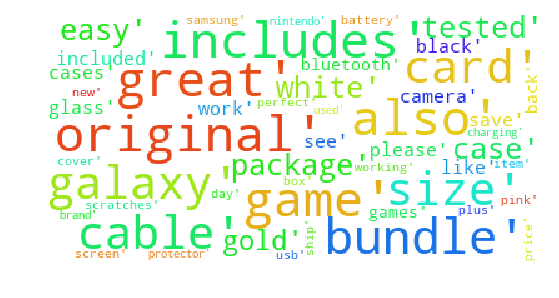

In [17]:
aaa =generate_wordcloud(electronics100)
fig = plt.figure(figsize=(5,5), dpi=100)
ax = plt.axes([0,0,1,1])
plt.imshow(aaa, interpolation="nearest", aspect="equal")
plt.axis('off')
plt.show()

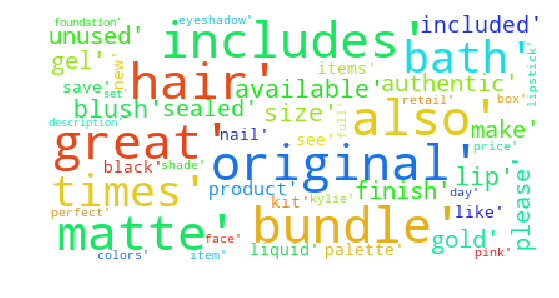

In [18]:
aaa =generate_wordcloud(beauty100)
fig = plt.figure(figsize=(5,5), dpi=100)
ax = plt.axes([0,0,1,1])
plt.imshow(aaa, interpolation="nearest", aspect="equal")
plt.axis('off')
plt.show()

## Pre-processing: tf-idf
tf-idf is the acronym for Term Frequency–inverse Document Frequency. It quantifies the importance of a particular word in relative to the vocabulary of a collection of documents or corpus. The metric depends on two factors:

Term Frequency: the occurences of a word in a given document (i.e. bag of words)
Inverse Document Frequency: the reciprocal number of times a word occurs in a corpus of documents
Think about of it this way: If the word is used extensively in all documents, its existence within a specific document will not be able to provide us much specific information about the document itself. So the second term could be seen as a penalty term that penalizes common words such as "a", "the", "and", etc. tf-idf can therefore, be seen as a weighting scheme for words relevancy in a specific document.

In [20]:
train = train[pd.notnull(train['item_description'])]

In [21]:
test["item_description"].notnull().sum()

693359

In [22]:
len(test["item_description"])

693359

In [23]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10,
                             max_features=180000,
                             tokenizer=tokenize,
                             ngram_range=(1, 2))

In [24]:
train[(train['item_description'].notnull())]['item_description'].values

array(['No description yet',
       'This keyboard is in great condition and works like it came out of the box. All of the ports are tested and work perfectly. The lights are customizable via the Razer Synapse app on your PC.',
       'Adorable top with a hint of lace and a key hole in the back! The pale pink is a 1X, and I also have a 3X available in white!',
       ..., 'Used once or twice, still in great shape.',
       'There is 2 of each one that you see! So 2 red 2 orange and 2 of the big red and orange ones! They are from world market!',
       'New with tag, red with sparkle. Firm price, no free shipping.'], dtype=object)

In [25]:
all_desc = np.append(train['item_description'].values, test['item_description'].values)
vz = vectorizer.fit_transform(list(all_desc))

In [26]:
#  create a dictionary mapping the tokens to their tfidf values
tfidf = dict(zip(vectorizer.get_feature_names(), vectorizer.idf_))
tfidf = pd.DataFrame(columns=['tfidf']).from_dict(
                    dict(tfidf), orient='index')
tfidf.columns = ['tfidf']

In [27]:
tfidf.sort_values(by=['tfidf'], ascending=True).head(10)

,tfidf
new,2.175653
size,2.330674
brand,2.755660
condition,2.799306
brand new,2.874418
free,2.903426
shipping,3.070592
worn,3.107882
used,3.165310
never,3.276901


In [28]:
tfidf.sort_values(by=['tfidf'], ascending=False).head(10)

,tfidf
wedgwood,13.195054
novelty bill,13.195054
light volts,13.195054
place step,13.195054
♡oval,13.195054
lmt,13.195054
postnatal,13.195054
subdrip rda,13.195054
volts clicks,13.195054
thumb point,13.195054


In [29]:
trn = train.copy()
tst = test.copy()
trn['is_train'] = 1
tst['is_train'] = 0

sample_sz = 15000

combined_df = pd.concat([trn, tst])
combined_sample = combined_df.sample(n=sample_sz)
vz_sample = vectorizer.fit_transform(list(combined_sample['item_description']))

In [30]:
trn.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1482531 entries, 0 to 1482534
Data columns (total 21 columns):
train_id             1482531 non-null int64
name                 1482531 non-null object
item_condition_id    1482531 non-null int64
category_name        1476204 non-null object
brand_name           849852 non-null object
price                1482531 non-null float64
shipping             1482531 non-null int64
item_description     1482531 non-null object
cat1                 1476204 non-null object
cat2                 1476204 non-null object
cat3                 1476204 non-null object
des_len              1482531 non-null int64
des_cleaned          1482531 non-null object
des_cleaned_o        1481830 non-null object
new_tag              1482531 non-null int64
warrant              1482531 non-null int64
cat_new_level        1482531 non-null int64
new_category         1476204 non-null object
des_len_level        1482531 non-null int64
tokens               1482531 non-null ob

In [36]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693359 entries, 0 to 693358
Data columns (total 19 columns):
test_id              693359 non-null int64
name                 693359 non-null object
item_condition_id    693359 non-null int64
category_name        690301 non-null object
brand_name           397834 non-null object
shipping             693359 non-null int64
item_description     693359 non-null object
cat1                 690301 non-null object
cat2                 690301 non-null object
cat3                 690301 non-null object
des_len              693359 non-null int64
des_cleaned          693359 non-null object
des_cleaned_o        693071 non-null object
new_tag              693359 non-null int64
warrant              693359 non-null int64
cat_new_level        693359 non-null int64
new_category         690301 non-null object
des_len_level        693359 non-null int64
tokens               693359 non-null object
dtypes: int64(8), object(11)
memory usage: 100.5+ MB


In [32]:
combined_sample.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15000 entries, 730595 to 639178
Data columns (total 22 columns):
brand_name           8672 non-null object
cat1                 14927 non-null object
cat2                 14927 non-null object
cat3                 14927 non-null object
cat_new_level        15000 non-null int64
category_name        14927 non-null object
des_cleaned          15000 non-null object
des_cleaned_o        14994 non-null object
des_len              15000 non-null int64
des_len_level        15000 non-null int64
is_train             15000 non-null int64
item_condition_id    15000 non-null int64
item_description     15000 non-null object
name                 15000 non-null object
new_category         14927 non-null object
new_tag              15000 non-null int64
price                10247 non-null float64
shipping             15000 non-null int64
test_id              4753 non-null float64
tokens               15000 non-null object
train_id             10247 non-n

In [33]:
from sklearn.decomposition import TruncatedSVD

n_comp=30
svd = TruncatedSVD(n_components=n_comp, random_state=42)
svd_tfidf = svd.fit_transform(vz_sample)

In [34]:
from sklearn.manifold import TSNE
tsne_model = TSNE(n_components=2, verbose=1, random_state=42, n_iter=500)

In [35]:
tsne_tfidf = tsne_model.fit_transform(svd_tfidf)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 15000 samples in 0.041s...
[t-SNE] Computed neighbors for 15000 samples in 14.657s...
[t-SNE] Computed conditional probabilities for sample 1000 / 15000
[t-SNE] Computed conditional probabilities for sample 2000 / 15000
[t-SNE] Computed conditional probabilities for sample 3000 / 15000
[t-SNE] Computed conditional probabilities for sample 4000 / 15000
[t-SNE] Computed conditional probabilities for sample 5000 / 15000
[t-SNE] Computed conditional probabilities for sample 6000 / 15000
[t-SNE] Computed conditional probabilities for sample 7000 / 15000
[t-SNE] Computed conditional probabilities for sample 8000 / 15000
[t-SNE] Computed conditional probabilities for sample 9000 / 15000
[t-SNE] Computed conditional probabilities for sample 10000 / 15000
[t-SNE] Computed conditional probabilities for sample 11000 / 15000
[t-SNE] Computed conditional probabilities for sample 12000 / 15000
[t-SNE] Computed conditional probabilities for sa

In [37]:
from bokeh.io import push_notebook, show, output_notebook
from bokeh import plotting as bp
from bokeh.models import HoverTool


In [38]:
output_notebook()
plot_tfidf = bp.figure(plot_width=700, plot_height=600,
                       title="tf-idf clustering of the item description",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

Loading BokehJS ...

In [39]:
combined_sample['item_description']

730595     Size 5.5 women In excellent used condition wit...
265043     Just selling because duplicate. -- Thank you f...
481614                                    Perfect condition!
240356                                    No description yet
448054     •These are high quality •Fast Shipping Compati...
643696     TROJAN CONDOM FIRE & ICE 4 BOX 3 IN EACH. FREE...
815473     I have more color options in my shop check the...
65631      Has some wrinkles in the inside foam but does ...
459216     NWOT. Removed thinking I would wear but I neve...
152861     New Samsung Car kit Samsung Adaptive Fast Char...
36413                                              brand new
315619     This bundle includes the Nintendo Switch (all ...
459329     New without tags, too small for me unfortunate...
685142     Signature print Shows wear (bought used) but n...
586560     Authentic and in great condition. Free shippin...
28124      Size 6x so cute for your princess... Can be pa...
1167136    Worn once. Ve

In [41]:
combined_sample['item_description'].reset_index()["item_description"].head()

0    Size 5.5 women In excellent used condition wit...
1    Just selling because duplicate. -- Thank you f...
2                                   Perfect condition!
3                                   No description yet
4    •These are high quality •Fast Shipping Compati...
Name: item_description, dtype: object

In [42]:
tfidf_df = pd.DataFrame(tsne_tfidf, columns=['x', 'y'])
tfidf_df['description'] = combined_sample['item_description'].reset_index()["item_description"].copy()
tfidf_df['tokens'] = combined_sample['tokens'].reset_index()["tokens"].copy()
tfidf_df['category'] = combined_sample['cat1'].reset_index()["cat1"].copy()

In [86]:
tfidf_df.head()

,x,y,description,tokens,category
0,-22.775480,-3.811505,Size 5.5 women In excellent used condition wit...,"[size, women, excellent, used, condition, with...",Women
1,5.542904,20.893948,Just selling because duplicate. -- Thank you f...,"[selling, duplicate, thank, taking, time, visi...",NaN
2,11.389679,-8.463866,Perfect condition!,"[perfect, condition]",Women
3,-20.540569,-21.158297,No description yet,"[description, yet]",Men
4,18.765240,24.558317,•These are high quality •Fast Shipping Compati...,"[•these, high, quality, •fast, shipping, compa...",Electronics


In [85]:
plot_tfidf.scatter(x='x', y='y', source=tfidf_df, alpha=0.7)
hover = plot_tfidf.select(dict(type=HoverTool))
hover.tooltips={"description": "@description", "tokens": "@tokens", "category":"@category"}
show(plot_tfidf)

## K-means

In [45]:
from sklearn.cluster import MiniBatchKMeans

num_clusters = 30 # need to be selected wisely
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters,
                               init='k-means++',
                               n_init=1,
                               init_size=1000, batch_size=1000, verbose=0, max_iter=1000)

In [46]:
kmeans = kmeans_model.fit(vz)
kmeans_clusters = kmeans.predict(vz)
kmeans_distances = kmeans.transform(vz)

In [48]:
sorted_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()

for i in range(num_clusters):
    print("Cluster %d:" % i)
    aux = ''
    for j in sorted_centroids[i, :10]:
        aux += terms[j] + ' | '
    print(aux)
    print() 

Cluster 0:


IndexError: list index out of range

In [56]:
# repeat the same steps for the sample
kmeans = kmeans_model.fit(vz_sample)
kmeans_clusters = kmeans.predict(vz_sample)
kmeans_distances = kmeans.transform(vz_sample)
# reduce dimension to 2 using tsne
tsne_kmeans = tsne_model.fit_transform(kmeans_distances)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 15000 samples in 0.078s...
[t-SNE] Computed neighbors for 15000 samples in 19.163s...
[t-SNE] Computed conditional probabilities for sample 1000 / 15000
[t-SNE] Computed conditional probabilities for sample 2000 / 15000
[t-SNE] Computed conditional probabilities for sample 3000 / 15000
[t-SNE] Computed conditional probabilities for sample 4000 / 15000
[t-SNE] Computed conditional probabilities for sample 5000 / 15000
[t-SNE] Computed conditional probabilities for sample 6000 / 15000
[t-SNE] Computed conditional probabilities for sample 7000 / 15000
[t-SNE] Computed conditional probabilities for sample 8000 / 15000
[t-SNE] Computed conditional probabilities for sample 9000 / 15000
[t-SNE] Computed conditional probabilities for sample 10000 / 15000
[t-SNE] Computed conditional probabilities for sample 11000 / 15000
[t-SNE] Computed conditional probabilities for sample 12000 / 15000
[t-SNE] Computed conditional probabilities for sa

In [89]:
#combined_sample.reset_index(drop=True, inplace=True)
kmeans_df = pd.DataFrame(tsne_kmeans, columns=['x', 'y'])
kmeans_df['cluster'] = kmeans_clusters
kmeans_df['description'] = combined_sample['item_description'].reset_index()['item_description']
kmeans_df['category'] = combined_sample['cat1'].reset_index()['cat1']
#kmeans_df['cluster']=kmeans_df.cluster.astype(str).astype('category')

In [90]:
kmeans_df.head()

,x,y,cluster,description,category
0,-17.805704,-14.677963,7,Size 5.5 women In excellent used condition wit...,Women
1,7.125269,-7.087460,15,Just selling because duplicate. -- Thank you f...,NaN
2,-35.763672,13.049186,9,Perfect condition!,Women
3,1.678696,-31.005606,6,No description yet,Men
4,28.754240,-9.713488,2,•These are high quality •Fast Shipping Compati...,Electronics


In [91]:
plot_kmeans = bp.figure(plot_width=700, plot_height=600,
                        title="KMeans clustering of the description",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

In [92]:
from bokeh.models.sources import ColumnDataSource
from bokeh import palettes


In [93]:
a=list()
for i in kmeans_clusters:
    if i not in a:
        a.append(i)
colormap = palettes.inferno(30)
colorr = list()
for i in a:
    colorr.append(colormap[i])

In [94]:
source = ColumnDataSource(data=dict(x=kmeans_df['x'], y=kmeans_df['y'],
                                    color=colorr,
                                    description=kmeans_df['description'],
                                    category=kmeans_df['category'],
                                    cluster=kmeans_df['cluster']))

plot_kmeans.scatter(x='x', y='y', color='color', source=source)
hover = plot_kmeans.select(dict(type=HoverTool))
hover.tooltips={"description": "@description", "category": "@category", "cluster":"@cluster" }
show(plot_kmeans)

C:\ProgramData\Anaconda3\lib\site-packages\bokeh\models\sources.py:137: BokehUserWarning: ColumnDataSource's columns must be of the same length. Current lengths: ('category', 15000), ('cluster', 15000), ('color', 30), ('description', 15000), ('x', 15000), ('y', 15000)
  "Current lengths: %s" % ", ".join(sorted(str((k, len(v))) for k, v in data.items())), BokehUserWarning))


## Latent Dirichlet Allocation
### Latent Dirichlet Allocation (LDA) is an algorithms used to discover the topics that are present in a corpus.

LDA starts from a fixed number of topics. Each topic is represented as a distribution over words, and each document is then represented as a distribution over topics. Although the tokens themselves are meaningless, the probability distributions over words provided by the topics provide a sense of the different ideas contained in the documents.

Reference: https://medium.com/intuitionmachine/the-two-paths-from-natural-language-processing-to-artificial-intelligence-d5384ddbfc18

### Its input is a bag of words, i.e. each document represented as a row, with each columns containing the count of words in the corpus. We are going to use a powerful tool called pyLDAvis that gives us an interactive visualization for LDA.

In [100]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [97]:
cvectorizer = CountVectorizer(min_df=4,
                              max_features=180000,
                              tokenizer=tokenize,
                              ngram_range=(1,2))

In [98]:
cvz = cvectorizer.fit_transform(combined_sample['item_description'])

In [101]:
lda_model = LatentDirichletAllocation(n_components=20,
                                      learning_method='online',
                                      max_iter=20,
                                      random_state=42)

In [102]:
X_topics = lda_model.fit_transform(cvz)

In [103]:
n_top_words = 10
topic_summaries = []

topic_word = lda_model.components_  # get the topic words
vocab = cvectorizer.get_feature_names()

for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    topic_summaries.append(' '.join(topic_words))
    print('Topic {}: {}'.format(i, ' | '.join(topic_words)))

Topic 0: works | iphone | charger | screen | keep | phone | watch | work | scratches | apple
Topic 1: great | free | home | great condition | condition | smoke | free home | smoke free | pet | size
Topic 2: color | black | soft | grey | sealed | brush | material | beautiful | lace | wash
Topic 3: new | brand | brand new | never | description | yet | description yet | used | new never | never used
Topic 4: comes | box | original | great | still | used | feel | big | see | also
Topic 5: skin | full | shade | makeup | foundation | non | shades | unopened | lashes | mascara
Topic 6: size | small | worn | black | condition | size small | perfect | times | box | blue
Topic 7: worn | never | never worn | blue | body | dark | washed | cream | black | girls
Topic 8: lip | twice | liquid | face | bottle | lipstick | natural | kit | dry | slime
Topic 9: silver | back | picture | shown | find | ring | photo | nwt | jewelry | inch
Topic 10: size | large | women | nike | bought | size large | used |

In [104]:
# reduce dimension to 2 using tsne
tsne_lda = tsne_model.fit_transform(X_topics)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 15000 samples in 0.023s...
[t-SNE] Computed neighbors for 15000 samples in 12.959s...
[t-SNE] Computed conditional probabilities for sample 1000 / 15000
[t-SNE] Computed conditional probabilities for sample 2000 / 15000
[t-SNE] Computed conditional probabilities for sample 3000 / 15000
[t-SNE] Computed conditional probabilities for sample 4000 / 15000
[t-SNE] Computed conditional probabilities for sample 5000 / 15000
[t-SNE] Computed conditional probabilities for sample 6000 / 15000
[t-SNE] Computed conditional probabilities for sample 7000 / 15000
[t-SNE] Computed conditional probabilities for sample 8000 / 15000
[t-SNE] Computed conditional probabilities for sample 9000 / 15000
[t-SNE] Computed conditional probabilities for sample 10000 / 15000
[t-SNE] Computed conditional probabilities for sample 11000 / 15000
[t-SNE] Computed conditional probabilities for sample 12000 / 15000
[t-SNE] Computed conditional probabilities for sa

In [105]:
unnormalized = np.matrix(X_topics)
doc_topic = unnormalized/unnormalized.sum(axis=1)

lda_keys = []
for i, tweet in enumerate(combined_sample['item_description']):
    lda_keys += [doc_topic[i].argmax()]

lda_df = pd.DataFrame(tsne_lda, columns=['x','y'])
lda_df['description'] = combined_sample['item_description'].reset_index()['item_description']
lda_df['category'] = combined_sample['cat1'].reset_index()['cat1']
lda_df['topic'] = lda_keys
lda_df['topic'] = lda_df['topic'].map(int)

In [111]:
b=list()
for i in lda_keys:
    if i not in b:
        b.append(i)
colormap = palettes.inferno(20)
colorrs = list()
for i in b:
    colorrs.append(colormap[i])

In [114]:
plot_lda = bp.figure(plot_width=700, plot_height=600,
                        title="LDA topic visualization",
    tools="pan,wheel_zoom,box_zoom,reset,hover,previewsave",
    x_axis_type=None, y_axis_type=None, min_border=1)

In [115]:
source = ColumnDataSource(data=dict(x=lda_df['x'], y=lda_df['y'],
                                    color=colorrs,
                                    description=lda_df['description'],
                                    topic=lda_df['topic'],
                                    category=lda_df['category']))

plot_lda.scatter(source=source, x='x', y='y', color='color')
hover = plot_kmeans.select(dict(type=HoverTool))
hover = plot_lda.select(dict(type=HoverTool))
hover.tooltips={"description":"@description",
                "topic":"@topic", "category":"@category"}
show(plot_lda)

C:\ProgramData\Anaconda3\lib\site-packages\bokeh\models\sources.py:137: BokehUserWarning: ColumnDataSource's columns must be of the same length. Current lengths: ('category', 15000), ('color', 20), ('description', 15000), ('topic', 15000), ('x', 15000), ('y', 15000)
  "Current lengths: %s" % ", ".join(sorted(str((k, len(v))) for k, v in data.items())), BokehUserWarning))


In [70]:
trn = train.copy()
tst = test.copy()
trn['is_train'] = 1
tst['is_train'] = 0

combined_df = pd.concat([trn, tst])
vz_all = vectorizer.fit_transform(list(combined_df['item_description']))

In [71]:
from sklearn.decomposition import TruncatedSVD

n_comp=30
svd = TruncatedSVD(n_components=n_comp, random_state=42)
svd_tfidf_all = svd.fit_transform(vz_all)

In [72]:
from sklearn.manifold import TSNE
tsne_model = TSNE(n_components=2, verbose=1, random_state=42, n_iter=500)

In [ ]:
tsne_tfidf_all = tsne_model.fit_transform(svd_tfidf_all)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2175890 samples in 129.683s...


In [ ]:
print("a")